# Sistema automàtic per la detecció de COVID-19 en radiografies

Una de les applicacions de AI és el processament de imatges mèdiques. En particular, l'ús de les radiografies per una detecció no invasiva i ràpida del Covid-19 pot resultar extremadament útil per ajudar i agilitzar la tasca del personal mèdic [1][2].

En aquest projecte desenvoluparem un detector *Deep Learning* de Covid-19 en radiografies. Per això, utilitzarem imatges de la base de dades "Covid-chestxray-dataset" [3], generada per uns investigadors del grup de recerca [Mila](https://mila.quebec/en/) i de la Universitat de Montreal [4]. També farem servir imatges de radiogradies de pacients sans i amb pneumonia bacterial extretes de la competició de Kaggle "Chest X-Ray Images (Pneumonia)" [5].


En total, disposem d'un total de 426 imatges, dividides en conjunts d'entrenament (339 imatges), validació (42 imatges) i test (45 imatges).
Les particions es donen en llistes ".txt", on a cada imatge se li assigna una etiqueta:
- 0) Healthy
- 1) Covid-19
- 2) Pneumonia

L'objectiu consisteix en desenvolupar un sistema basat en xarxes neuronals capaç de classificar correctament les imatges en aquestes 3 categories.

**<u>Nota</u>**: Els resultats obtinguts per models entrenats en aquesta base de dades són purament per finalitats educatives i no es poden fer servir per un diagnòstic real sense validació clínica.


#### Referències
1. María Climent, 2020 [Covid-19: La Inteligencia Artificial De La Española Quibim Puede Acelerar El Diagnóstico Del Coronavirus](https://innovadores.larazon.es/es/esta-inteligencia-artificial-espanola-puede-acelerar-el-diagnostico-del-coronavirus/)
2. Angel Alberich-bayarri,2020 [Imagin, AI and Radiomix to understand and fight Coronavirus Covid-19](https://quibim.com/2020/02/14/imaging-ai-and-radiomics-to-understand-and-fight-coronavirus-covid-19/)
3. [Ieee8023/covid-chestxray-dataset](https://github.com/ieee8023/covid-chestxray-dataset)
4. Cohen, J.P., Morrison, P. and Dao, L., 2020. [COVID-19 image data collection](https://arxiv.org/pdf/2003.11597.pdf).
5. Paul Mooney, 2019 [Chest X-ray Images (pneumonia)](https://www.kaggle.com/paultimothymooney/chest-xray-pneumonia)
6. Souradip Chakraborty, 2020. [Detection Of Covid-19 Presence from Chest X-ray Scans Using Cnn & Class Activation Maps](https://towardsdatascience.com/detection-of-covid-19-presence-from-chest-x-ray-scans-using-cnn-class-activation-maps-c1ab0d7c294b)

7. Cohen, J.P., Hashir, M., Brooks, R. and Bertrand, H., 2020. [On the limits of cross-domain generalization in automated X-ray prediction](https://arxiv.org/pdf/2002.02497.pdf)

8. Karim, M., Döhmen, T., Rebholz-Schuhmann, D., Decker, S., Cochez, M. and Beyan, O., 2020. [Deepcovidexplainer: Explainable covid-19 predictions based on chest x-ray images](https://arxiv.org/pdf/2004.04582.pdf).

9. Wang, L., Wong, A. (2020). [COVID-Net: A Tailored Deep Convolutional Neural Network Design for Detection of COVID-19 Cases from Chest Radiography Images](https://arxiv.org/abs/2003.09871)

10. Zhou, B., Khosla, A., Lapedriza, A., Oliva, A. and Torralba, A., 2016. [Learning deep features for discriminative localization](https://arxiv.org/pdf/1512.04150.pdf). In Proceedings of the IEEE conference on computer vision and pattern recognition (pp. 2921-2929).

11. Mordvintsev, A., Olah, C. and Tyka, M., 2015. [Inceptionism: Going deeper into neural networks](https://ai.googleblog.com/2015/06/inceptionism-going-deeper-into-neural.html).

# Preparació del Dataset 

En quest primer apartat s'analitzaran les imatges de la base de dades i es disenyarà un *pipeline* per carregar les imatges i preparar-les per la xarxa neuronal. 

Caldrà tenir en compte factors com:
- Tamany d'entrada de les imatges
- Normalització de les imatges
- Visualitzacions d'algunes mostres per cadascuna de les classes
- Tècniques de *data augmentation* per augmentar el tamany del conjunt de dades

I, en general, qualsevol tècnica que considereu que pot millorar la implementació i resultats d'aquest projecte.

## Lectura dels fitxers d'entrada

In [ ]:
# Càrrega de llibreries

# scipy 1.1.0 és necessari per poder realitzar les visualitzacions dels activations maps amb keras vis
!pip install q scipy==1.1.0

import re
import scipy

from vis.visualization import visualize_cam
from vis.utils import utils

from IPython.display import clear_output, display

from keras.applications.vgg16 import VGG16
from keras.applications import VGG19
from keras.applications import InceptionV3
from keras.applications import Xception
from keras.models import Model
from keras import Input
from keras.preprocessing.image import ImageDataGenerator
from keras.optimizers import Adadelta

from sklearn.preprocessing import OneHotEncoder
from sklearn.metrics import confusion_matrix, recall_score, accuracy_score

from keras.models import Sequential
from keras.layers import Dense, Conv2D, Flatten, Activation, Dropout, MaxPooling2D, BatchNormalization
from keras.activations import linear
from keras.models import load_model
from keras.callbacks import EarlyStopping

import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

import random
import pickle

from PIL import Image
from PIL import ImageOps

# Deduir si es troba en Colab o en un altre entorn per tal de resoldre la versió de tensorflow i muntar el disc virtual
try:
  from google.colab import drive
  %tensorflow_version 1.x
  drive.mount("gdrive")
  IN_COLAB = True
except:
  IN_COLAB = False


# Compatibilitat amb GDrive per a la gestió de fitxers
def get_directory(file):
  if (not IN_COLAB):
    return file
  else:
    return "/content/gdrive/My Drive/DL/Practica/" + file

# Definició de constants
IMAGE_SIZE = 224




     |████████████████████████████████| 31.2MB 102kB/s 
ERROR: umap-learn 0.4.3 has requirement scipy>=1.3.1, but you'll have scipy 1.1.0 which is incompatible.
ERROR: tensorflow 2.2.0 has requirement scipy==1.4.1; python_version >= "3", but you'll have scipy 1.1.0 which is incompatible.
ERROR: plotnine 0.6.0 has requirement scipy>=1.2.0, but you'll have scipy 1.1.0 which is incompatible.
ERROR: albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.2.9 which is incompatible.
  Found existing installation: scipy 1.4.1
    Uninstalling scipy-1.4.1:
      Successfully uninstalled scipy-1.4.1


Using TensorFlow backend.


TensorFlow is already loaded. Please restart the runtime to change versions.
Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at gdrive


En primer lloc, es llegeixen els fitxers del directori DATASET partint de les separacions creades pels fitxers de text de train, validació i test.

Els resultats s'emmagatzemen en un dataframe de pandas per tal de ser tractats amb més facilitat posteriorment.

In [ ]:
def read_txt_data(file,image_type):
    file_internal = get_directory(file)
    ret = []
    with open(file_internal, 'r') as myfile:
        data = myfile.read()
        lines = data.split("\n")
        for line in lines:
            m = re.search('^(\d+)\s+(.+)$', line)
            if (m):
                ret = ret + [(image_type,m.group(1),m.group(2))]
    return ret
        
def read_training():
    path = 'DATASET/training.txt'
    return read_txt_data(path,'train')

def read_test():
    path = 'DATASET/testing.txt'
    return read_txt_data(path,'test')

def read_validation():
    path = 'DATASET/validation.txt'
    return read_txt_data(path,'validation')

def read_all():
    ret = []
    ret = ret + read_training()
    ret = ret + read_test()
    ret = ret + read_validation()
    return ret
    
# Obtenir el dataset de pandas  
covid_raw = pd.DataFrame(read_all(), columns=['type','class','file'])
covid_raw.head()

,type,class,file
0,train,2,PNEUMONIA/person888_bacteria_2812.jpeg
1,train,2,PNEUMONIA/person1209_bacteria_3161.jpeg
2,train,2,PNEUMONIA/person1718_bacteria_4540.jpeg
3,train,2,PNEUMONIA/person549_bacteria_2303.jpeg
4,train,2,PNEUMONIA/person831_bacteria_2742.jpeg


## Preprocessament de les imatges
Un dels factors més importants a l'hora de dissenyar la xarxa és el mida de les dades d'entrada. L'entrada de la xarxa ha de ser de dimensió constant per a totes les instàncies.

Per tant, el primer pas consisteix a esbrinar la distribució de les variables que determinen la dimensió de la imatge.

In [ ]:
def get_image_size(file):
    im = Image.open(get_directory('DATASET/' + file))
    return im.size

def apply_image_row(row):
    size = get_image_size(row['file'])
    return pd.Series({'width': size[0], 'height': size[1]})

covid = pd.concat([covid_raw, covid_raw.apply(apply_image_row, axis=1)], axis=1)
covid.head()

,type,class,file,width,height
0,train,2,PNEUMONIA/person888_bacteria_2812.jpeg,527,219
1,train,2,PNEUMONIA/person1209_bacteria_3161.jpeg,1576,1376
2,train,2,PNEUMONIA/person1718_bacteria_4540.jpeg,1800,1256
3,train,2,PNEUMONIA/person549_bacteria_2303.jpeg,1032,704
4,train,2,PNEUMONIA/person831_bacteria_2742.jpeg,896,528


In [ ]:
# Descriure width
covid.width.describe()

count     426.000000
mean     1357.861502
std       535.917177
min       255.000000
25%      1024.000000
50%      1358.000000
75%      1670.500000
max      4280.000000
Name: width, dtype: float64

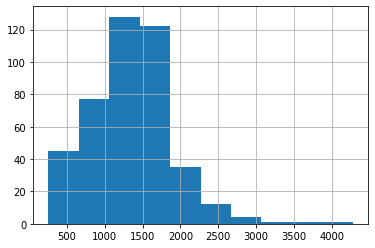

In [ ]:
# Histograma de width
covid.width.hist()
plt.show()

In [ ]:
# Descriure height
covid.height.describe()

count     426.000000
mean     1110.098592
std       521.494797
min       178.000000
25%       720.000000
50%      1060.500000
75%      1383.000000
max      4095.000000
Name: height, dtype: float64

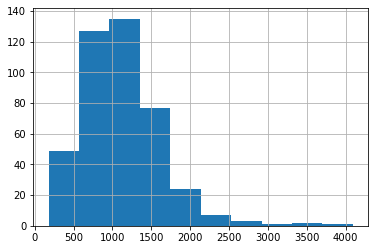

In [ ]:
# Histograma de height
covid.height.hist()
plt.show()

Després d'analitzar aquestes dades, juntament amb l'observació empírica de les imatges, es determina que:

1. Les imatges tenen mida variable. La seva amplada i altura varia en gran quantitat.
2. Algunes imatges no tenen la mateixa escala que les altres.
3. Les imatges presenten soroll (anotacions de text, indicacions, aparells sobre el pacient...)

Aquests fets presenten dificultats per al rendiment d'una xarxa convolucional. Idealment, totes les imatges haurien de tenir la mateix mida, la mateixa escala, i presentar les característiques mínimes per tal de poder diferenciar la seva classe. 

El problema de la dimensió i l'escala es pot solucionar mitjançant l'augment de dades del dataset. Com més imatges diferents existeixin (amb diferent escala, proporcions, rotació...), millor serà capaç la xarxa de capturar les característiques més importants que diferencien les classes del problema, ignorant aquelles que no el resolen.

Una altra alternativa a l'augment del dataset és utilitzar una arquitectura que sigui invariant a aquestes transformacions. La tècnica de spatial pyramid pooling [R1] permet alimentar la xarxa amb imatges de diferents mides i escales. No s'aplicarà a la pràctica, però es menciona com a possible alternativa a tota la fase de processament de les imatges.

Per a tractar el soroll present en les imatges, serà indispensable contenir un dataset suficientment gran perquè la xarxa aprengui a discriminar el soroll com a no rellevant per a la tasca de classificació. Les tres classes presenten el soroll de la mateixa manera, pel que no hauria de presentar cap problema si la xarxa aprèn a ignorar-ho. Augmentar el dataset pot resultar benficiós també en aquest aspecte.

Així doncs, s'escull utilitzar unes dimensions constants per a totes les imatges d'entrenament, test i validació. Donat que la mediana de les dimensions se situa entorn dels 1000px, es redimensionaran totes les imatges a 224x244 píxels, que és la mida estàndard per a moltes arquitectures conegudes de cnn (VGG, sobretot). Aquest redimensionat serà part d'un pipeline de processat que s'explica en els següents apartats.

## Prepreocessament de les imatges
El preprocessament de les imatges segueix els següents objectius:

1. Poder adaptar el conjunt d'imatges d'entrada o bé futures imatges a l'input de la xarxa neuronal mitjançant la definició d'un procés.
2. Millorar el procés d'entrenament de la xarxa. Reduir el temps necessari perquè la xarxa convergeixi o bé millorar els resultats mitjançant un augment de la capacitat d'abstracció.

En primer lloc, les xarxes convolucionals tradicionals admeten inputs de mida fixada. Habitualment l'entrada és una matriu quadrada de píxels. Per tant, un dels objectius necessaris d'aquest procés és aconseguir una funció de conversió que prengui la imatge d'entrada i doni com a sortida una imatge quadrada de dimensions constants.

En segon lloc, per tal d'optimitzar el procés d'entrenament, es poden aplicar algunes transformacions prèvies a l'alimentació de la xarxa amb les dades. En aquesta secció es debaten quines s'han d'aplicar i en quin ordre.

### Escalat i retallat
La primera transformació ha de consistir a escalar les imatges. Convertir les dimensions en constants per a tot el conjunt d'entrada.

Això suposa un problema, ja que les imatges d'entrada tenen diferents mides per a les seves dues dimensions.

Es poden aplicar les següents solucions:

1. Realitzar l'operació de crop: retalla les cantonades de les imatges fins a aconseguir una imatge quadrada. Té el desavantatge que es pot perdre informació útil en el procés de retallat. (algunes parts rellevants de les imatges podrien desaparèixer).
2. Omplir les imatges amb padding sense informació: en aquest cas, s'omplen totes les imatges amb píxels buits (0,0,0) per tal d'aconseguir una imatge quadrada.
3. Redimensionar les imatges directament a la mida desitjada. No és recomanat, ja que les imatges tenen mides diferents. Algunes es contraurien d'una manera diferent de les altres.

S'opta per la segona, ja que és la que minimitza la pèrdua d'informació. Tot seguit s'exemplifica el procés de conversió utilitzant dues imatges d'exemple (una amb molta lluminositat i l'altre sense tanta).

Però, també es podria alimentar a la xarxa amb les dues versions d'imatges (primera i segona). Aquesta estratègia es discuteix més endavant.

Un cop s'ompli la imatge amb el padding, ja es pot escalar a la mida desitjada. Inicialment, s'utilitzarà la mida 224x244, que és la que accepta una arquitectura del tipus vgg16.

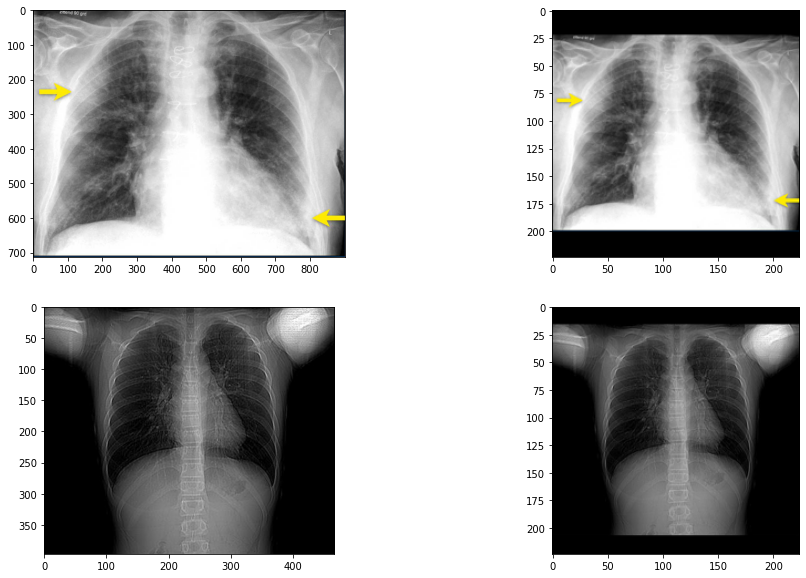

In [ ]:
def read_image(row):
    return Image.open(get_directory('DATASET/' + row['file']))

# Realitza l'extensió de les imatges amb el color de padding indicat
def expand2square(pil_img, background_color):
    width, height = pil_img.size
    if width == height:
        return pil_img
    elif width > height:
        result = Image.new(pil_img.mode, (width, width), background_color)
        result.paste(pil_img, (0, (width - height) // 2))
        return result
    else:
        result = Image.new(pil_img.mode, (height, height), background_color)
        result.paste(pil_img, ((height - width) // 2, 0))
        return result
    
def expand_image(image):
    colors = None
    if (image.mode == 'L'):
        colors = 0
    else:
        colors = (0,0,0)
    return expand2square(image,colors)

def square_size(image):
    return ImageOps.fit(expand_image(image), size=(IMAGE_SIZE,IMAGE_SIZE))

# Mostra la comparativa entre les dues imatges
def plot_comparison(img1, img2, img3, img4, color=None):
    fig = plt.figure(figsize=(16,10))
    images = [img1,img2,img3,img4]
    for i,e in enumerate(images):
        fig.add_subplot(2, 2, i+1)
        if (color == 1): 
            plt.imshow(e)
        elif (color == 'norm'):
            plt.imshow(e, cmap='gray')
        else:
            plt.imshow(e, cmap='gray', vmin=0, vmax=255)

# Resultat d'aplicar l'operació d'expansió dels marges per ajustar l'imatge a una mida quadrada. Es mostren dos exemples.
img1Original = Image.open(get_directory('DATASET/COVID-19/2-chest-filmc.jpg'))
img2Original = Image.open(get_directory('DATASET/COVID-19/ciaa199.pdf-001-c.png'))

img1SquaredResized = square_size(img1Original)
img2SquaredResized = square_size(img2Original)

plot_comparison(img1Original, img1SquaredResized, img2Original, img2SquaredResized)

Però, també pot resultar interessant retallar les imatges per tal de contribuir a la generació sintètica de dades d'entrenament. Una bona estratègia pot consistir a proporcionar la mateixa imatge múltiples vegades de la següent manera:

1. Es pren la imatge amb les cantonades augmentades per tal que sigui quadrada.
2. Es pren la imatge amb les cantonades retallades (que també és quadrada).
3. Partint de la diferència de píxels entre les dues, es generen N imatges dins de l'interval, escalades a un valor dins d'aquest rang de píxels.

D'aquesta manera, es poden arribar a generar N+2 instàncies d'una mateixa radiografia amb valors molt diferents d'informació no rellevant (els marges negres), que seran útils a l'hora d'entrenar la xarxa, ja que si es realitza el procés per a totes les imatges d'entrenament, la xarxa aprendrà amb més facilitat que el marge no és una característica classificadora (ja que serà present de la mateixa forma en totes les classes).

Addicionalment, també pot treballar millor independentment de l'escala en què es presenti la radiografia.

Més endavant es realitzaran aquestes transformacions sobre el conjunt d'entrenament. Així i tot es defineix la funció que permet transformar les imatges originals en ajustades quadrades:

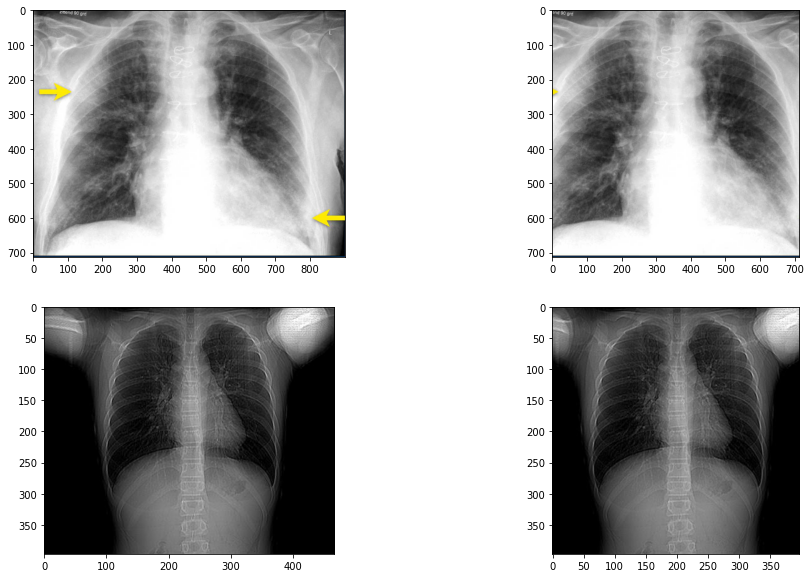

In [ ]:
def crop_image(image):
    minDim = min(image.width,image.height)
    return ImageOps.fit(image, (minDim, minDim))


plot_comparison(img1Original, crop_image(img1Original), img2Original, crop_image(img2Original))

### Disminuir soroll
El soroll és present en la gran majoria d'imatges. Existeixen etiquetes, fletxes, lletres... Eliminar aquest tipus de soroll no és fàcil, ja que presenta les mateixes tonalitats que la imatge (quan els indicadors són de color blanc).

Però, existeixen alguns indicadors que són acolorits. En aquest cas, és possible aplicar una senzilla funció per convertir tots els colors fora del rang de la radiografia (colors vius) en negres. D'aquesta manera no es dóna tanta importància als indicadors (ja que seran 0,0,0).

La norma per eliminar un color és que la desviació típica dels seus 3 canals sigui superior a 32. Tots els colors en blanc i negre tenen el mateix valor pels 3 canals, pel que aquest procés proporciona un cert marge d'error.

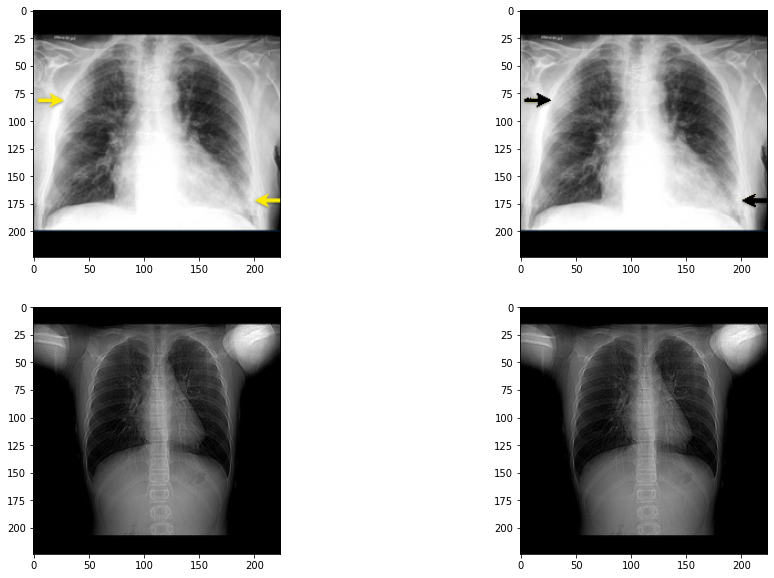

In [ ]:
def correct_pixel(elem):
    if (elem[0] == elem[1] and elem[1] == elem[2]):
        return elem
    elif (elem[:3].std() > 32):
        return np.zeros(len(elem))
    else:
        return elem

def remove_noise(image):
    if (image.mode == 'L'):
        return image
    else:
        return Image.fromarray(np.uint8(np.apply_along_axis(correct_pixel,2,image)))
        
# Corregir els indicadors de color. Mostra l'aplicació sobre els dos exemples anteriors
img1NoNoise = remove_noise(img1SquaredResized)
img2NoNoise = remove_noise(img2SquaredResized)

plot_comparison(img1SquaredResized, img1NoNoise, img2SquaredResized, img2NoNoise)

En aquest moment ja es poden col·lapsar les imatges en blanc i negre. La informació del color és poca i no aporta res, ja que la majoria de radiografies són en blanc i negre (tret d'algunes excepcions i píxels concrets).

S'aplica una reducció dels 3 canals a 1 de sol. Els colors més vius ja han sigut eliminats a negre per tal d'evitar que fossin transformats a un gris.

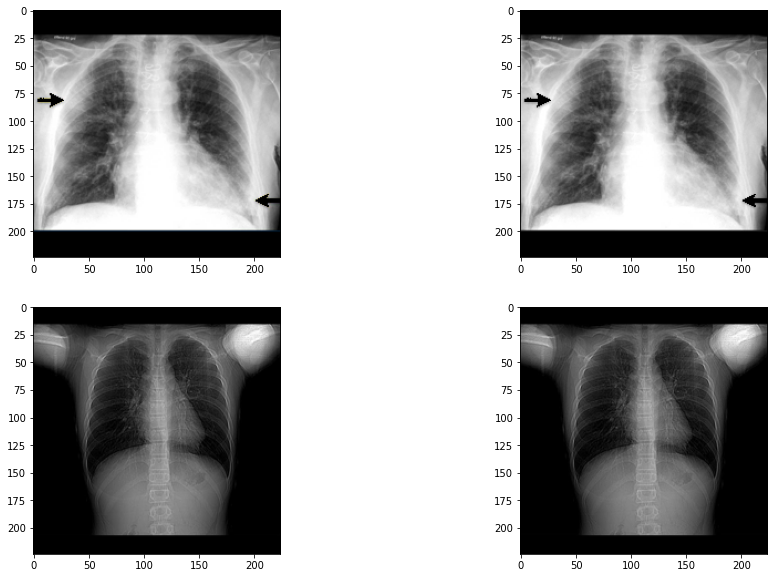

In [ ]:
img1Grayscale = ImageOps.grayscale(img1NoNoise)
img2Grayscale = ImageOps.grayscale(img2NoNoise)

plot_comparison(img1NoNoise, img1Grayscale, img2NoNoise, img2Grayscale)

Els canvis en les imatges d'exemple són indiferents, com es pot observar.

### Estandarització i normalització
Un cop es disposen de totes les imatges en blanc i negre, es poden normalitzar les imatges. El procés de normalització pot o no incloure una estandarització. Si s'inclou, cal decidir com es calculen la mitjana i la desviació típica per a estandaritzar:

1. En cada radiografía de forma individual (estandarització unitària).
2. En un grup de radiografies (estandarització batch).
3. En tot el conjunt de dades (estandarizació global).

L'avantatge de l'estandarització és que les característiques similars tindràn els mateixos valors pels píxels en diferentes imatges. 

Per la seva part, la normalització converteix el rang de possibles valors d'entrada a [0,1]. Si s'aplica la normalització després d'estandarizar, els valors dels píxels relatius entre ells seràn els mateixos que abans d'estandaritzar. Per tant, són processos excloents.

Així i tot, sí que es pot aplicar l'equalització de l'histograma [R2]. Aquesta técnica és especialment útil en el cas de tractar amb radiografies, ja que el seu histograma d'intensitat es desplaça entre una i altre radiografía per culpa de les variacions en la il·luminació. 

A continuació s'aplica aquesta técnica i s'observen els resultats sobre les dues imatges d'exemple, amb il·luminacions diferents.

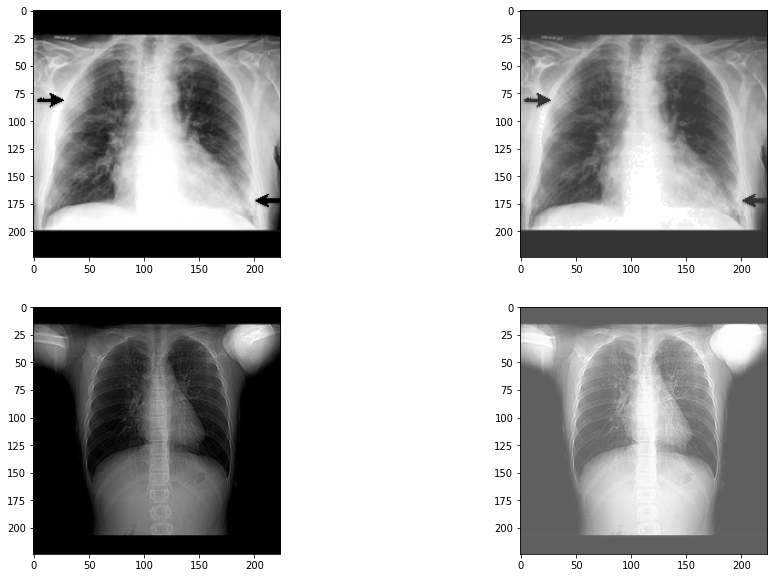

In [ ]:
def df(img): 
    values = [0]*256
    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            values[img[i,j]]+=1
    return values


def cdf(hist):  
    cdf = [0] * len(hist) 
    cdf[0] = hist[0]
    for i in range(1, len(hist)):
        cdf[i]= cdf[i-1]+hist[i]
    # Normalitzar l'histograma
    cdf = [ele*255/cdf[-1] for ele in cdf]
    return cdf

def equalize_image(image):
    my_cdf = cdf(df(image))
    image_equalized = np.interp(image, range(0,256), my_cdf)
    return image_equalized

def equalize_image_og(image):
    return equalize_image(np.array(image))

# Equalització d'histogrames per igualar el contrast de la radiografia
img1Eq = equalize_image_og(img1Grayscale)
img2Eq = equalize_image_og(img2Grayscale)

plot_comparison(img1Grayscale, img1Eq, img2Grayscale, img2Eq)

Els resultats són bastant bons, dues imatges amb il·luminacions completament diferents passen a tenir uns colors similars. Aquest preprocessat serà útil per reduir el temps d'entrenament i evitar que la xarxa pugui ignorar completament les diferències de contrast entre les imatges del dataset.

Ara si, ja es pot normalitzar. Per a normalitzar, s'aplica una funció de normalització que transformi els píxels [0,255] al rang [0,1].

Normalized image min: 0.0. max: 1.0


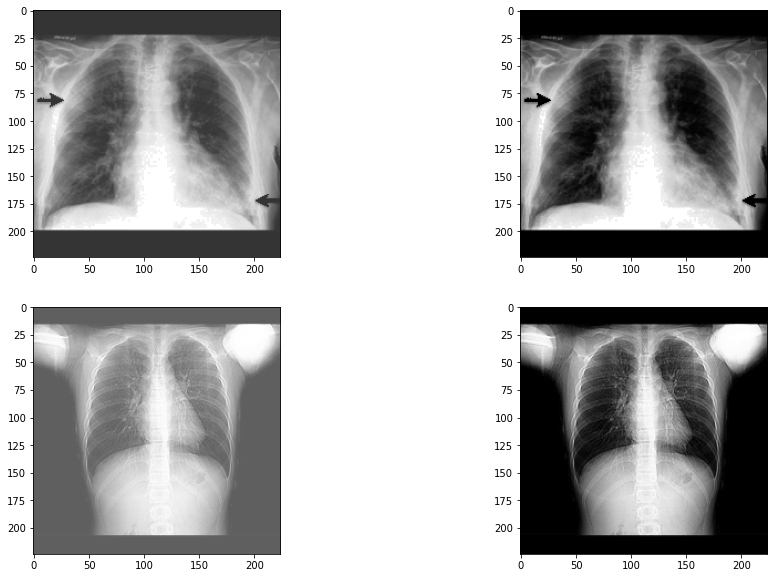

In [ ]:
def normalize(image_arr):
    x = image_arr
    normalized = (x-np.amin(x))/(np.amax(x)-np.amin(x))
    return normalized

def normalize_image(image):
    image_arr = np.array(image)
    return normalize(image_arr)

img1Norm = normalize_image(img1Eq)
img2Norm = normalize_image(img2Eq)
# Comprovar que la normalització ha succeit correctament
print("Normalized image min: {0}. max: {1}".format(img1Norm.min(), img1Norm.max()))

# Mostra la comparació entre la imatge amb el constrast equalitzat i la normalitzada a partir d'aquesta
plot_comparison(img1Eq, img1Norm * 255, img2Eq, img2Norm * 255)

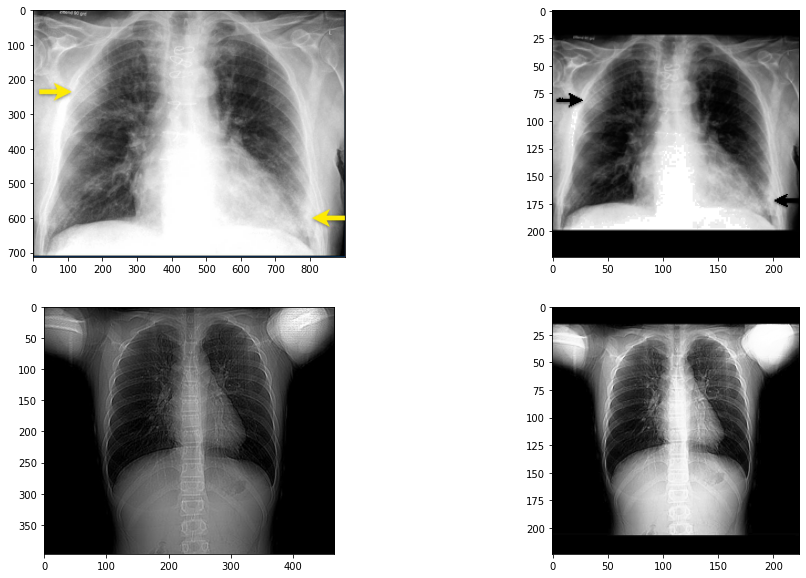

In [ ]:
# Per últim, observar com resulta la transformació des del pas inicial fins al pas final
plot_comparison(img1Original, img1Norm * 255, img2Original, img2Norm * 255)

## Generació de dades sintètiques

### Redimensionat d'imatges
Donat que una xarxa convolucional és sensible a l'escala de les imatges, i que cada imatge del dataset té una escala diferent (encara que bastant similar), sembla raonable generar imatges sintètiques de diferents escales.

En concret, es proposa implementar la característica que s'ha comentat anteriorment. A partir d'una imatge quadrada ampliada (a la qual s'ha afegit marge buit per fer-la quadrada) i de la seva contrapartida (imatge retallada de forma quadrada partint de la dimensió més petita), es poden generar N imatges dins de l'interval de píxels que separa l'una de l'altra.

Aquest procés genera N instàncies d'imatges amb marges i escales diferents, essent la radiografia essencialment la mateixa. La xarxa ignorarà aquestes diferències, ja que totes les imatges pertanyen a la mateixa classe.

A continuació es mostra un exemple del procés:

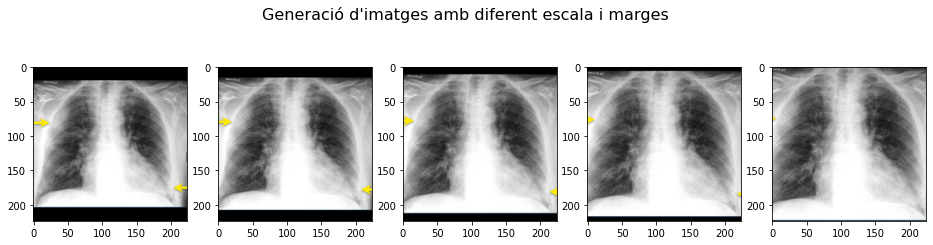

In [ ]:
# Nombre d'intervals de generació
N_INTERVALS = 5

def image_intervals_single(image):
    expanded = expand_image(image)
    fitted = crop_image(image)
    return image_intervals(expanded, fitted.width)

def image_intervals(image_expanded, min_dim):
    ret = []
    expanded = image_expanded
    interval = (expanded.width - min_dim) / (N_INTERVALS)
    if (interval == 0):
        return ret
    start = expanded.width - interval
    for i in range(N_INTERVALS):
        scale = int(start)
        temp = ImageOps.fit(ImageOps.crop(expanded, interval * (i+1) / 2), (IMAGE_SIZE, IMAGE_SIZE))
        ret = ret + [temp]
        start = start - interval
    return ret

images = image_intervals_single(img1Original)

fig = plt.figure(figsize=(16,4))
fig.suptitle("Generació d'imatges amb diferent escala i marges", fontsize=16)
for i,e in enumerate(images):
    fig.add_subplot(1, 5, i+1)
    plt.imshow(e)

plt.show()

### Rotació d'imatges
Addicionalment, també es pot optar per girar les imatges un cert angle. Una estratègia pot consistir a duplicar totes les imatges del dataset de train (inclús les generades artificialment), i aplicar una rotació arbitrària dins d'un cert interval, per exemple, -5 i 5 graus, ja que no s'espera que les radiografies siguin massa inclinades.

No es considera el voltejat de les imatges (flip) en cap sentit. Les raons són les següents:

1. Les radiografies mai es presenten voltejades verticalment, per tant, no hi ha necessitat que la xarxa generalitzi aquest cas.
2. Les radiografies sempre es presenten en la mateixa orientació (R és sempre a l'esquerra de la imatge i L a la dreta), per tant, no es presenten fotografies invertides horitzontalment en aquest aspecte. Almenys en tot el dataset no n'hi ha cap (comprovat de forma manual).

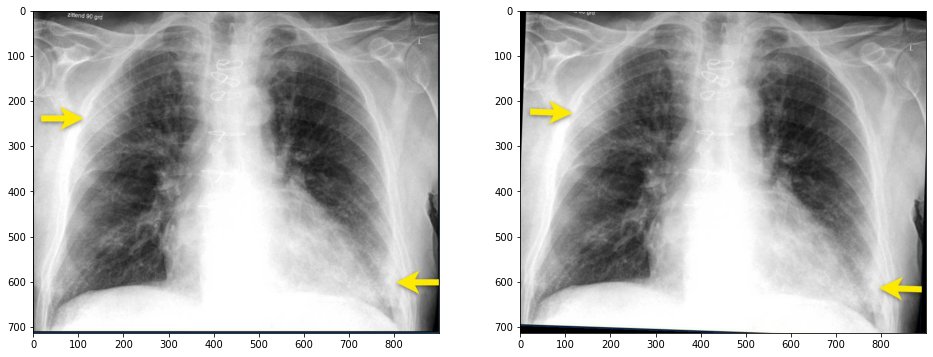

In [ ]:
def rotate_image(image):
    angle = random.randint(-5,5)
    return image.rotate(angle, expand=False, resample=Image.BILINEAR)

images = [img1Original, rotate_image(img1Original)]
fig = plt.figure(figsize=(16,12))
for i,e in enumerate(images):
    fig.add_subplot(1, 2, i+1)
    plt.imshow(e)

## Pipeline de preprocessat
El procés de preprocessat d'imatges, després de tot el que s'ha comentat, consisteix en els següents punts:

1. Es divideix el dataset en train, test i validació. 
2. Pel conjunt de train, es realitzen les transformacions, en ordre:
  1. S'emmagatzema la dimensió més petita de la imatge original (serà feta servir després).
  2. S'expandeix la imatge fins que sigui quadrada.
  3. S'elimina el soroll de la imatge expandida.
  4. Es normalitzen totes les imatges en l'escala de grisos
  5. Es realitza l'equalització de l'histograma per estandarditzar el contrast de totes les imatges.
  6. Es generen les imatges redimensionades a partir de la imatge del pas anterior i la dimensió emmagatzemada en el primer pas. Un total de 5 imatges per cada imatge d'entrada.
  7. S'ajusta la mida de totes les imatges a les constants definides. (224x224)
  8. Es genera una còpia de totes les imatges generades fins ara i s'aplica una rotació arbitrària sobre les còpies. (resulta en 10 imatges per cada radiografia original al final de tot).
3. Pel conjunt de test i validació:
  1. S'expandeixen les imatges fins que siguin quadrades.
  2. Es redimensionen a les constants definides.
  3. S'elimina el soroll.
  4. Es converteixen a l'escala de grisos.
  5. S'equalitzen les imatges.
4. Finalment, per a tots els conjunts, es normalitzen les imatges en l'interval [0,1] per cadascun dels seus píxels.

No s'ha d'aplicar cap augment en els sets de validació i test, només en el de train. És per aquest motiu que els pipelines de processat són diferents.

Aquest procés és el més eficient amb menys pèrdua d'informació, ja que evita haver d'aplicar les transformacions a les imatges sintètiques.

In [ ]:
def process_train_row(row):
    image = read_image(row)
    min_dim = min(image.width, image.height)
    image_expanded = expand_image(image)
    image_nonoise = remove_noise(image_expanded)
    image_gray = ImageOps.grayscale(image_nonoise)
    
    image_equalized = equalize_image_og(image_gray)
    # Es requereix normalitzar després d'equalitzar
    normalized = normalize_image(image_equalized)
    image_equalized_pil = Image.fromarray(np.uint8(normalized*255)) 
    intervals = image_intervals(image_equalized_pil, min_dim) + [ImageOps.fit(image_equalized_pil,size=(IMAGE_SIZE,IMAGE_SIZE))]
    rotated = [rotate_image(im) for im in intervals]
    normalized = [normalize_image(img) for img in intervals+rotated]
    rows = [pd.Series(row).append(pd.Series(data=[norm], index=['new_image'])) for norm in normalized]
    return rows

def process_test_validation_row(row):
    image = read_image(row)
    processed_image = normalize_image(equalize_image_og(ImageOps.grayscale(remove_noise(square_size(image)))))
    return [pd.Series(row).append(pd.Series(data=[processed_image], index=['new_image']))]
    
def create_train_dataset(train_df):
    rows = []
    i = 1
    for index, row in train_df.iterrows():
        rows = rows + process_train_row(row)
        clear_output(wait=True)
        print("processed {0} out of {1} rows".format(i,len(train_df)))
        i = i + 1
    return pd.DataFrame(rows)

def create_test_validation_dataset(df):
    rows = []
    i = 1
    for index,row in df.iterrows():
        rows = rows + process_test_validation_row(row)
        clear_output(wait=True)
        print("processed {0} out of {1} rows".format(i,len(df)))
        i = i + 1
    return pd.DataFrame(rows)

processed 1 out of 1 rows


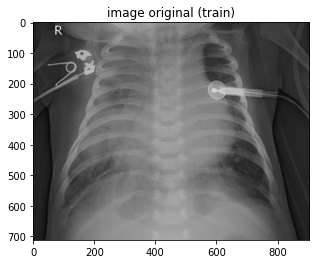

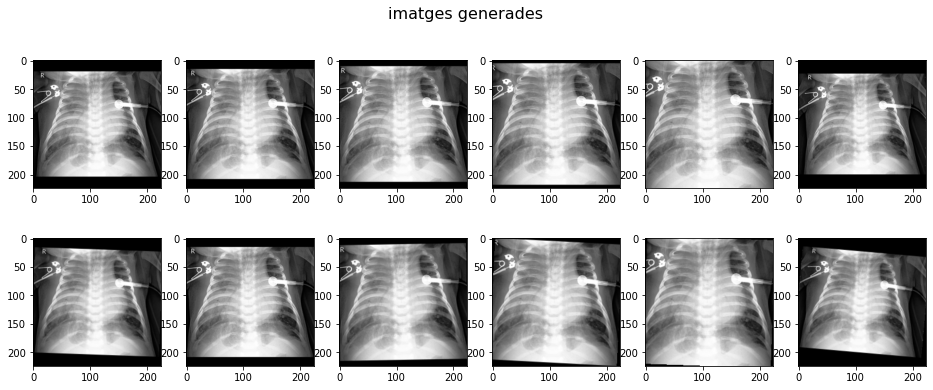

In [ ]:
# Mostra un exemple de totes les imatges generades a partir d'una
index = 8
random.seed(index)

train_processed = create_train_dataset(covid[covid['type'] == 'train'][index:index+1])

image_og = read_image(covid[covid['type'] == 'train'].iloc[index])
plt.imshow(image_og, cmap='gray')
plt.title("image original (train)")
plt.show()

fig = plt.figure(figsize=(16,6))
fig.suptitle("imatges generades",fontsize=16)
for index, row in train_processed.iterrows():
    fig.add_subplot(2, 6, index+1)
    plt.imshow(row['new_image'], cmap='gray')

processed 1 out of 1 rows


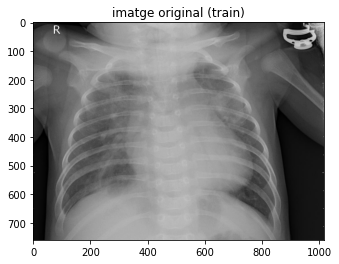

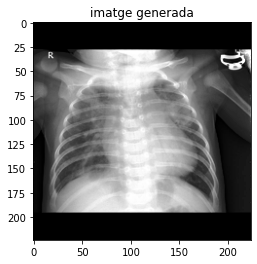

In [ ]:
# Mostra un exemple d'una imatge de validacio abans i després
index = 8
random.seed(index)

validation_processed = create_test_validation_dataset(covid[covid['type'] == 'validation'][index:index+1])

image_og = read_image(covid[covid['type'] == 'validation'].iloc[index])
plt.imshow(image_og, cmap='gray')
plt.title("imatge original (train)")
plt.show()

for index, row in validation_processed.iterrows():
    plt.imshow(row['new_image'], cmap='gray')
    plt.title("imatge generada")
    plt.show()


### Aplicació del pipeline sobre el dataset
Finalment, s'apliquen els processos sobre els datasets de train, validació i test. Emmagatzemant els resultats en un fitxer per tal de poder carregar-los amb facilitat en diferents sessions.

Addicionalment, abans d'emmagatzemar el fitxer de train, es realitza un resampling (permutació d'indexos), per evitar que l'ordre de les imatges influeixi en el procés d'entrenament.

In [ ]:
covid_train = create_train_dataset(covid[covid['type'] == 'train'])
covid_test = create_test_validation_dataset(covid[covid['type'] == 'test'])
covid_validation = create_test_validation_dataset(covid[covid['type'] == 'validation'])

# Realitzar el shuffle de les dades d'entrenament per barrejar les imatges. Afavoreix la generalització al no introduïr consecutivament les 10 imatges sintètiques generades per una de sola.
covid_train = covid_train.sample(frac=1, random_state=3).reset_index()

# Guardar els resultats en fitxers
covid_train.to_pickle(get_directory("./covid_train.pkl"))
covid_test.to_pickle(get_directory("./covid_test.pkl"))
covid_validation.to_pickle(get_directory("./covid_validation.pkl"))

També es considera emmagatzemar les imatges d'entrada en format RGB, ja que alguns models de xarxes neuronals no accepten un únic canal (p.ex: vgg16). 

Aquests datasets no són normalitzats en [0,1], per tant, s'obtenen a través de la multiplicació per 255 del valor normalitzat anteriorment. 

In [ ]:
def get_rgb(row):
    norm = row['new_image']
    n_array = np.uint8(norm*255)
    row['new_image'] = np.stack((n_array,)*3, axis=-1)
    return row

covid_train_rgb = covid_train.apply(func=get_rgb, axis=1)
covid_validation_rgb = covid_validation.apply(func=get_rgb, axis=1)
covid_test_rgb = covid_test.apply(func=get_rgb, axis=1)

# Guardar els resultats en fitxers
covid_train_rgb.to_pickle(get_directory("covid_train_rgb.pkl"))
covid_test_rgb.to_pickle(get_directory("covid_test_rgb.pkl"))
covid_validation_rgb.to_pickle(get_directory("covid_validation_rgb.pkl"))

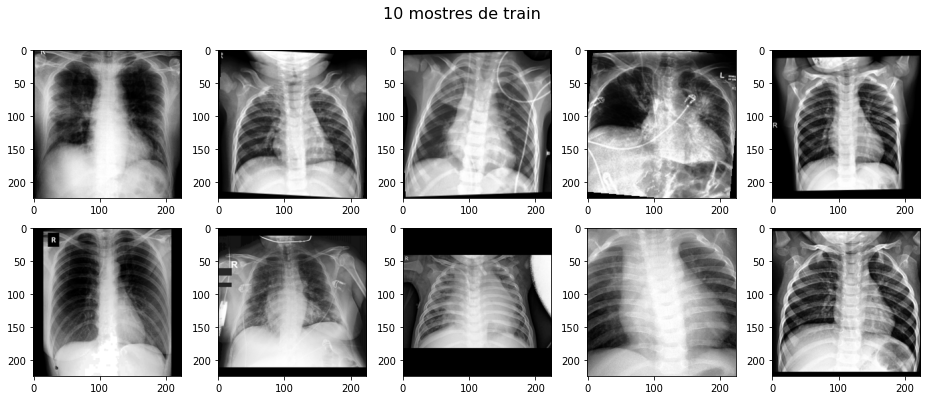

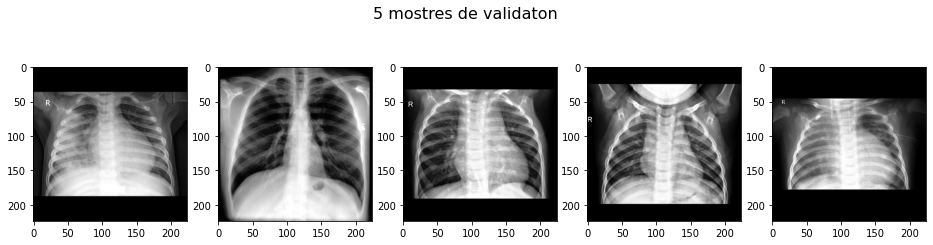

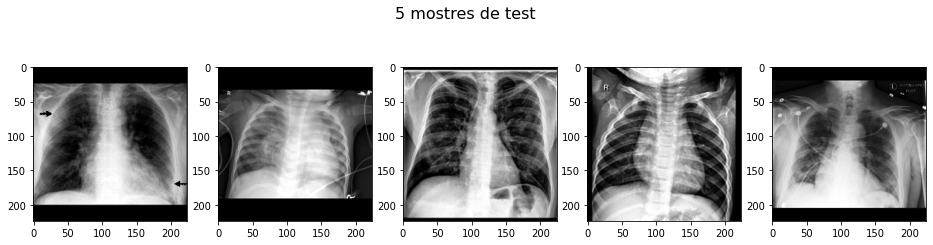

In [ ]:
# Visualitzar una mostra aleatoria de les dades d'entrenament, de validacio i de test
fig = plt.figure(figsize=(16,6))
fig.suptitle("10 mostres de train",fontsize=16)
for i in range(10):
    index = random.randint(0, len(covid_train))
    fig.add_subplot(2,5, i+1)
    plt.imshow(covid_train.iloc[index]['new_image'], cmap='gray')
    
plt.show()
fig = plt.figure(figsize=(16,4))
fig.suptitle("5 mostres de validaton",fontsize=16)
for i in range(5):
    index = random.randint(0, len(covid_validation))
    fig.add_subplot(1,5, i+1)
    plt.imshow(covid_validation.iloc[index]['new_image'], cmap='gray')

plt.show()
fig = plt.figure(figsize=(16,4))
fig.suptitle("5 mostres de test",fontsize=16)

for i in range(5):
    index = random.randint(0, len(covid_test))
    fig.add_subplot(1,5, i+1)
    plt.imshow(covid_test.iloc[index]['new_image'], cmap='gray')

plt.show()

# Creació dels models i mètriques d'avaluació 

En aquesta secció es demana desenvolupar el *pipeline* per a la creació i entrenament del/s model/s. 

Es treballarà amb les dades de *training* i *validació*. 

Caldrà tenir en compte aspectes com:

- Quina arquitectura és la més adecuada per resoldre aquest problema
- Quines mètriques cal utilitzar per mesurar de forma correcta el comportament del model
- Visualitzacions de les corbes d'entrenament/validació que ajudin a decidir quin model ha estat el millor i perquè
- Considerar un model *baseline* per poder comparar les mètriques (i.e. utilitzar prediccions aleatòries o fer servir un model naïve, com per exemple una xarxa neuronal amb poques capes)


## Split i preparació de dades finals
En primer lloc es divideix l'espai en train i test. Es codifica la classe com un vector OneHot i es separen les dades del dataframe original segons la columna de type en train, validation i test.

In [ ]:
# Llegir les dades
covid_train = pd.read_pickle(get_directory("./covid_train.pkl"))
covid_test = pd.read_pickle(get_directory("./covid_test.pkl"))
covid_validation = pd.read_pickle(get_directory("./covid_validation.pkl"))

In [ ]:
# Llegir les dades en RGB
covid_train_rgb = pd.read_pickle(get_directory("./covid_train_rgb.pkl"))
covid_test_rgb = pd.read_pickle(get_directory("./covid_test_rgb.pkl"))
covid_validation_rgb = pd.read_pickle(get_directory("./covid_validation_rgb.pkl"))

In [ ]:

# Funció per codificar la variable classificadora
enc = OneHotEncoder()
enc.fit([['0'],['1'],['2']])
    
def encode_variable(var):
    labels = var.values
    labels_mat = labels.reshape(len(var),1)
    enc_labels = enc.transform(labels_mat).toarray()
    return enc_labels

def prepare_data(train, validation, test, color_channel):
    x_train = train['new_image'].values
    y_train = encode_variable(train['class'])

    x_validation = validation['new_image'].values
    y_validation = encode_variable(validation['class'])

    x_test = test['new_image'].values
    y_test = encode_variable(test['class'])

    x_train = np.concatenate(x_train).reshape(len(x_train),IMAGE_SIZE,IMAGE_SIZE,color_channel)
    x_validation = np.concatenate(x_validation).reshape(len(x_validation),IMAGE_SIZE,IMAGE_SIZE,color_channel)
    x_test = np.concatenate(x_test).reshape(len(x_test),IMAGE_SIZE,IMAGE_SIZE,color_channel)

    return (x_train,y_train,x_validation,y_validation,x_test,y_test)

# Obtenir les matrius finals de train, test i validació per a un únic canal i per a RGB (no normalitzat)
x_train, y_train, x_validation, y_validation, x_test, y_test = prepare_data(covid_train, covid_validation, covid_test, 1)
x_train_rgb, y_train_rgb, x_validation_rgb, y_validation_rgb, x_test_rgb, y_test_rgb = prepare_data(covid_train_rgb, covid_validation_rgb, covid_test_rgb, 3)

Es realitza una comprovació de que realment els splits coinideixin amb els indexos i les imatges adequades.

Class according to y vector: [['0']]. Real class: 0


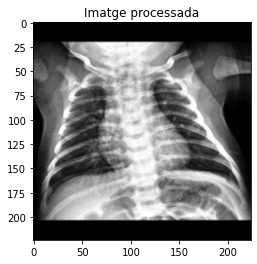

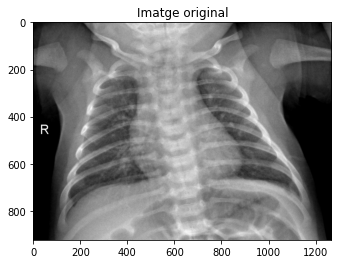

In [ ]:
def test_correct_split(index, x_train, y_train, df_train, channels = 1):
    print("Class according to y vector: {0}. Real class: {1}".format(enc.inverse_transform([y_train[index]]),df_train.iloc[index]['class']))
    if (channels == 1):
        im_shape = (IMAGE_SIZE,IMAGE_SIZE)
    else:
        im_shape = (IMAGE_SIZE,IMAGE_SIZE,3)
    plt.imshow(x_train[index].reshape(im_shape), cmap='gray')
    plt.title("Imatge processada")
    plt.show()
    image = Image.open(get_directory('DATASET/' + df_train.iloc[index]['file']))
    plt.imshow(image, cmap='gray')
    plt.title("Imatge original")
    plt.show()

test_correct_split(333, x_train, y_train, covid_train)

Class according to y vector: [['0']]. Real class: 0


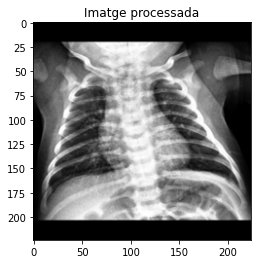

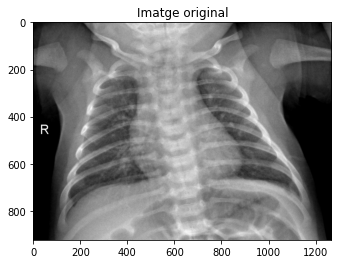

In [ ]:
test_correct_split(333, x_train_rgb, y_train_rgb, covid_train_rgb, 3)

## Model 1: Xarxa convolucional bàsica
El primer model creat consisteix en una xarxa simple que imita l'arquitectura de la VGG16, però sense tantes capes.

Consta de 4 capes convolucionals de 32, 32, 64 i 64 filtres, respectivament, amb capes de pooling cada 2 d'aquestes. Finalment, s'afegeix una capa de dropout i una capa densa abans de la capa de sortida.

Aquest model serveix per a observar com respon la xarxa quan el nombre de capes és petit, evitant que les construccions molt abstractes puguin sorgir.

In [ ]:
input_shape = (len(x_train[0]),len(x_train[0][0]),1)
output_size = len(y_train[0])

model_1_raw = Sequential([
    Conv2D(filters=32, kernel_size=(3,3), strides=(1, 1), activation='relu', input_shape=input_shape),
    Conv2D(filters=32, kernel_size=(3,3), strides=(1, 1), activation='relu'),
    MaxPooling2D(pool_size=(2, 2), strides=(2,2)),
    Conv2D(filters=64, kernel_size=(3,3), strides=(1, 1), activation='relu'),
    Conv2D(filters=64, kernel_size=(3,3), strides=(1, 1), activation='relu'),
    MaxPooling2D(pool_size=(2, 2), strides=(2,2)),
    Flatten(),
    Dropout(0.25),
    Dense(64, activation='relu'),
    Dropout(0.25),
    Dense(output_size, activation='softmax')])

model_1_raw.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_9 (Conv2D)            (None, 222, 222, 32)      320       
_________________________________________________________________
conv2d_10 (Conv2D)           (None, 220, 220, 32)      9248      
_________________________________________________________________
max_pooling2d_5 (MaxPooling2 (None, 110, 110, 32)      0         
_________________________________________________________________
conv2d_11 (Conv2D)           (None, 108, 108, 64)      18496     
_________________________________________________________________
conv2d_12 (Conv2D)           (None, 106, 106, 64)      36928     
_________________________________________________________________
max_pooling2d_6 (MaxPooling2 (None, 53, 53, 64)        0         
_________________________________________________________________
flatten_3 (Flatten)          (None, 179776)           

In [ ]:
def compile_execute_model(model, x_train, y_train, x_validation, y_validation, epochs = 12, batch_size = 10):
    #es = EarlyStopping(monitor='loss', mode='min', verbose=1)
    # Compilació del model amb la funció de pèrdua d'entropia creuada categòrica, optimitzador Adadelta i mètrica de precisió
    model.compile(optimizer=Adadelta(learning_rate=0.01),loss='categorical_crossentropy',metrics=['accuracy'])
    # Ajustar el model
    history = model.fit(x_train,y_train,epochs=epochs, batch_size=batch_size, validation_data=(x_validation,y_validation), verbose=1)
    return (model, history)

# Visualitza la història del model creat pel conjunt d'entrenament i el de test
def visualize_model(hist,model):
    fig = plt.figure(figsize=(12, 4))

    plt.subplot(1,2,1)
    plt.plot(hist.history['accuracy'])
    plt.plot(hist.history['val_accuracy'])
    plt.title('{} accuracy'.format(model))
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Test'], loc='best')

    plt.subplot(1,2,2)
    plt.plot(hist.history['loss'])
    plt.plot(hist.history['val_loss'])
    plt.title('{} loss'.format(model))
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Test'], loc='best')
    fig.tight_layout()
    plt.show()

# Guarda el model i la història en un fitxer
def save_model_and_history(model, history, name):
    model.save(get_directory("./Models/{0}.h5".format(name)))
    hist_json_file = get_directory("./Models/{0}_history.pkl".format(name))
    with open(hist_json_file, 'wb') as file:
        pickle.dump(history, file, pickle.HIGHEST_PROTOCOL)

# Carrega el model i la història d'un fitxer
def load_model_and_history(name):
    model = load_model(get_directory("./Models/{0}.h5".format(name)))
    hist_json_file = get_directory("./Models/{0}_history.pkl".format(name))
    with open(hist_json_file, mode='rb') as f:
        hist = pickle.load(f)  
        return (model, hist)

# Diccionari amb les classes
class_labels= {
    '0':'healthy',
    '1':'covid-19',
    '2':'pneumonia'
}

# Dibuixa el mapa d'activació de les classes
def plot_map(grads, x_test, index, class_idx, predicted_class, y_real, y_pred, mode):
    fig, axes = plt.subplots(1,2,figsize=(14,5))
    if (mode == 'gray'):
        axes[0].imshow(x_test[index].reshape(IMAGE_SIZE,IMAGE_SIZE), cmap='gray')
        axes[1].imshow(x_test[index].reshape(IMAGE_SIZE,IMAGE_SIZE), cmap='gray')
    else:
        axes[0].imshow(x_test[index].reshape(IMAGE_SIZE,IMAGE_SIZE,3))
        axes[1].imshow(x_test[index].reshape(IMAGE_SIZE,IMAGE_SIZE,3))

    i = axes[1].imshow(grads,cmap="jet",alpha=0.8)
    fig.colorbar(i)
    plt.suptitle("P(class={}) = {:5.2f}. Real class={}".format(class_labels[predicted_class], y_pred[0,class_idx], class_labels[y_real]))
    plt.show()
    
# Funció per a dibuixar el mapa d'activació de les classes. Requereix canviar l'activació de la última capa cap a la lineal, per que fa una còpia del model.
def activation_heatmap(model, x_test, index, last_layer_name, last_conv_layer_name, y_real, mode, predictions):
    y_pred = predictions[index:index+1]
    predicted_class = enc.inverse_transform(y_pred)
    class_idx = y_pred.argmax(axis=1)[0]
    layer_idx = utils.find_layer_idx(model, last_layer_name)
    penultimate_layer_idx = utils.find_layer_idx(model, last_conv_layer_name) 
    seed_input = x_test[index:index+1]
    grad_map  = visualize_cam(
        model, 
        layer_idx, 
        class_idx, 
        seed_input, 
        penultimate_layer_idx = penultimate_layer_idx,
        backprop_modifier = None,
        grad_modifier= None
    )
    plot_map(grad_map, x_test, index, class_idx, predicted_class.ravel()[0], y_real.ravel()[0], y_pred, mode)

# Visualitza tots els mapes d'activació de les classes del conjunt proporcionat (x_test i y_test)
def visualize_test_activations(model, layer_names, x_test, y_test, mode='gray'):
    predictions = model.predict(x_test)
    layer_idx = utils.find_layer_idx(model, layer_names[0])
    model.layers[layer_idx].activation = linear
    model_temp = utils.apply_modifications(model)  
    for i, e in enumerate(x_test):
        activation_heatmap(model_temp, x_test, i, layer_names[0], layer_names[1], enc.inverse_transform([y_test[i]]), mode, predictions)

# Realitza les visualitzacions de totes les classes amb n_samples elements
def model_activation_maps(model, last_dense_layer_index, last_conv_layer_index, x, y, n_samples = 2, mode = 'gray'):
    # Obtenir n mostres de cada classe i visualitzar les activacions. S'ha d'especificar la última capa densa i la última capa convulucional de la xarxa
    x_map, y_map = get_n_samples_each_class(x, y, n_samples)
    visualize_test_activations(model, (model.layers[last_dense_layer_index].name,  model.layers[last_conv_layer_index].name), x_map, y_map, mode)

# Mostra els mapes d'activacio de les fallades de classificacio
def model_activation_maps_misses(model, last_dense_layer_index, last_conv_layer_index, x, y, n_samples = 2, mode = 'gray'):
    x_map, y_map = get_n_misses_model(model, x, y, n_samples)
    visualize_test_activations(model, (model.layers[last_dense_layer_index].name,  model.layers[last_conv_layer_index].name), x_map, y_map, mode)


# Funció per a dibuixar el mapa d'activació de les classes. Requereix canviar l'activació de la última capa cap a la lineal, per que fa una còpia del model.
def multiple_activation_heatmap(models, x, y_real, y_preds, index, last_conv_layer_indexes):
    grad_maps = []
    for i, model in enumerate(models):
        y_pred = y_preds[i]
        predicted_class = enc.inverse_transform(y_pred)
        class_idx = y_pred.argmax(axis=1)[0]
        layer_idx = -1
        penultimate_layer_idx = last_conv_layer_indexes[i]
        seed_input = x[index:index+1]
        grad_map  = visualize_cam(
            model, 
            layer_idx, 
            class_idx, 
            seed_input, 
            penultimate_layer_idx = penultimate_layer_idx,
            backprop_modifier = None,
            grad_modifier= None
        )
        grad_maps = grad_maps + [grad_map]

    fig, axes = plt.subplots(1,1+len(models),figsize=(24,8))

    axes[0].imshow(x[index].reshape(IMAGE_SIZE,IMAGE_SIZE,3))
    p = None
    for i, grads in enumerate(grad_maps):
        y_pred = y_preds[i]
        class_idx = y_pred.argmax(axis=1)[0]
        axes[i+1].imshow(x[index].reshape(IMAGE_SIZE,IMAGE_SIZE,3))
        p = axes[i+1].imshow(grads,cmap="jet",alpha=0.8)
        class_info = class_labels[enc.inverse_transform(y_pred).ravel()[0]]
        axes[i+1].set_title("Model {}. P(class={}) = {:5.2f}. Real class={}".format(i+1, class_info, y_pred[0,class_idx], class_labels[y_real.ravel()[0]]))

    plt.show()


# Dibuixa múltiples models amb els seus mapes d'activacio respectius
def models_activation_maps(model_1, model_2, model_1_last_conv_layer_index, model_2_last_conv_layer_index, x, y, n_samples_class):
    x_tmp, y_tmp = get_n_samples_each_class(x,y,n_samples_class)

    model_1.layers[-1].activation = linear
    model_1_temp = utils.apply_modifications(model_1)
    model_2.layers[-1].activation = linear
    model_2_temp = utils.apply_modifications(model_2)

    for i, e in enumerate(x_tmp):
        predictions_1 = model_1.predict(x_tmp[i:i+1])
        predictions_2 = model_2.predict(x_tmp[i:i+1])
        multiple_activation_heatmap([model_1_temp, model_2_temp], x_tmp, enc.inverse_transform([y_tmp[i]]), [predictions_1, predictions_2], i, [model_1_last_conv_layer_index, model_2_last_conv_layer_index])
# Obté n elements de cada classe dels datasets proporcionats
def get_n_samples_each_class(x, y, n):
    targets = enc.transform(np.array(list(class_labels.keys())).reshape(len(class_labels),1)).toarray()
    x_ret = None
    y_ret = None
    for t in targets:
        indexes = np.equal(y.argmax(axis=-1), t.argmax(axis=-1))
        if (x_ret is None):
            x_ret = x[indexes][:n]
        else: 
            x_ret = np.concatenate((x_ret, x[indexes][:n]))

        if (y_ret is None):
            y_ret = y[indexes][:n]
        else: 
            y_ret = np.concatenate((y_ret, y[indexes][:n]))

    return (x_ret, y_ret)

# Obté n falaldes de les prediccions
def get_n_misses(x, y, y_pred, n):
    misses = np.not_equal(y.argmax(axis=-1),y_pred.argmax(axis=-1))
    x_ret = x[misses][:n]
    y_ret = y[misses][:n]
    return (x_ret, y_ret)

def get_n_misses_model(model, x, y, n):
    y_pred = model.predict(x)
    return get_n_misses(x, y, y_pred, n)

# Evalua les mètriques del model
def evaluate_model(model, x_validation, y_validation):
    y_pred = model.predict(x_validation).argmax(axis=1)
    y_validation_1d = y_validation.argmax(axis=1)
    
    print("Accuracy: {0:.2f}%".format(accuracy_score(y_validation_1d, y_pred) * 100))
    print("Recall (covid-19 vs others): {0:.2f}%".format(recall_score(y_validation_1d, y_pred, average=None)[1] * 100))
    print("Confusion matrix: ")
    print(pd.DataFrame(confusion_matrix(y_validation_1d,y_pred), columns=['pred healthy','pred covid-19','pred pneumonia'], index=["real healthy",'real covid-19','real pneumonia']))

# Construeix un model importat de Keras (VGG, Xception...) Substitueix les capes denses per capes menys pesades
def build_pretrained_model(model, freeze_until=-4, not_freeze=False,):
    x = Flatten(name='flatten')(model.output)
    x = Dropout(0.25)(x)
    x = Dense(64, activation='relu', name='fc1')(x)
    x = Dropout(0.25)(x)
    x = Dense(3, activation='softmax', name='predictions')(x)
    ret = Model(model.input, x)
    # Congelar les capes tret de les dues últimes
    if (not not_freeze):
        for layer in ret.layers[:freeze_until]:
            layer.trainable = False
    return ret

In [ ]:
model_1,history_1 = compile_execute_model(model_1_raw, x_train, y_train, x_validation, y_validation)

Train on 4008 samples, validate on 42 samples
Epoch 1/12
4008/4008 [==============================] - 11s 3ms/step - loss: 0.5440 - accuracy: 0.7862 - val_loss: 0.4447 - val_accuracy: 0.8571
Epoch 2/12
4008/4008 [==============================] - 10s 3ms/step - loss: 0.2708 - accuracy: 0.9039 - val_loss: 0.4014 - val_accuracy: 0.8571
Epoch 3/12
4008/4008 [==============================] - 10s 3ms/step - loss: 0.2266 - accuracy: 0.9202 - val_loss: 0.4241 - val_accuracy: 0.8571
Epoch 4/12
4008/4008 [==============================] - 10s 3ms/step - loss: 0.2021 - accuracy: 0.9329 - val_loss: 0.4457 - val_accuracy: 0.8810
Epoch 5/12
4008/4008 [==============================] - 10s 3ms/step - loss: 0.1815 - accuracy: 0.9344 - val_loss: 0.3516 - val_accuracy: 0.8810
Epoch 6/12
4008/4008 [==============================] - 10s 3ms/step - loss: 0.1685 - accuracy: 0.9444 - val_loss: 0.4133 - val_accuracy: 0.8810
Epoch 7/12
4008/4008 [==============================] - 10s 3ms/step - loss: 0.1555 

In [ ]:
save_model_and_history(model_1, history_1,"model_1")

In [ ]:
model_1, history_1 = load_model_and_history("model_1")

### Validació del model 1.
Després d'entrenar el primer model, s'ha d'avaluar el seu rendiment.

El problema en concret (detecció de covid-19), és un problema de diagnòstic mèdic. Respecte a les tipologies de valors en la matriu de confusió, interessa saber:

1. TP i TN (True Positive i True Negative): És essencial determinar correctament els casos positius, ja que permet aplicar les mesures necessàries sobre la persona immediatament (quarantena, aïllament...).
2. FP (False Positive): Són el mal menor. Un fals positiu implica aplicar les mesures sobre una persona que no té la malaltia. Les implicacions de tenir un alt nombre de Fals Positiu són menors que les de tenir un alt nombre de Fals Negatiu.
3. FN (False Negative): Interessa específicament minimitzar aquests casos, ja que són els que es passen per alt, i que poden infectar a altres persones.

Per tant, interessa que el model creat maximitzi la taxa de TP envers la de FN. La mètrica que es vol avaluar és el **recall**. (TP / (TP + FN)).

Com que el model classifica 3 classes, s'ha d'avaluar mitjançant 1-vs-all classe covid-19 versus les altres.

In [ ]:
evaluate_model(model_1, x_validation, y_validation)

Accuracy: 88.10%
Recall (covid-19 vs others): 85.71%
Confusion matrix: 
                pred healthy  pred covid-19  pred pneumonia
real healthy              13              0               1
real covid-19              0             12               2
real pneumonia             2              0              12


Els resultats són bastant bons. La matriu de confusió mostra que totes les instàncies predites com a covid-19 eren TP, però sí que s'han realitzat 2 falsos negatius en covid-19. Això comporta que el recall no sigui el 100%.

Tot i ser un model simple, ha obtingut bons resultats. Però, s'ha de determinar si realment la xarxa ha après aquelles característiques que s'assemblen a les reals de diagnòstic.

En primer lloc s'observa com evoluciona la precisió i la pèrdua del model a través de les èpoques d'entrenament.

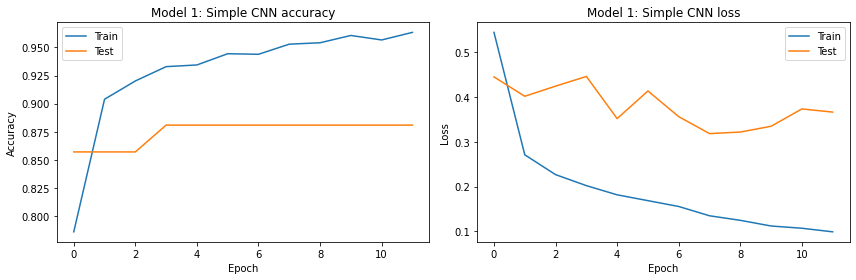

In [ ]:
visualize_model(history_1,"Model 1: Simple CNN")

El model assumeix ràpidament la màxima precisió en entrenament. En validació no és el cas, però no sembla que pateixi de sobreentrenament. Més aviat sembla que hagi arribat al límit de capacitat de predicció per a l'arquitectura proposada. 

La xarxa convergeix molt ràpidament. Sense les capes de dropout, assoleix la màxima precisió en entrenament durant les primeres èpoqes. El dropout però ajuda a estabilitar el creixement i a no sobreentrenar en excés.

Per determinar si realment la xarxa ha après una funció que s'assembli al diagnòstic real, es poden visualitzar els "class activation maps" per a la xarxa neuronal simple:

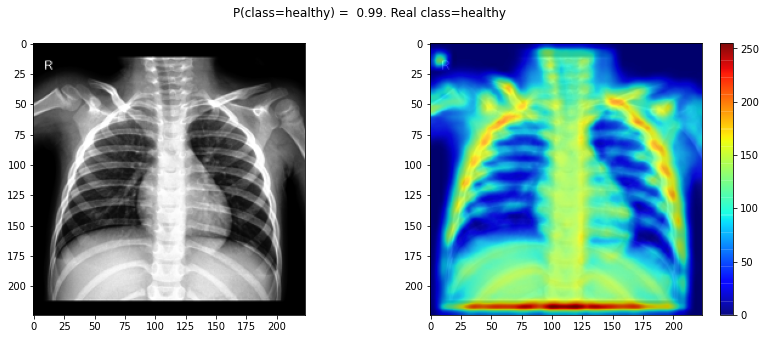

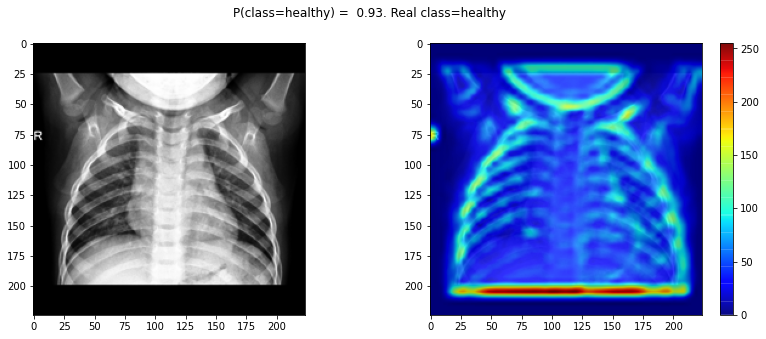

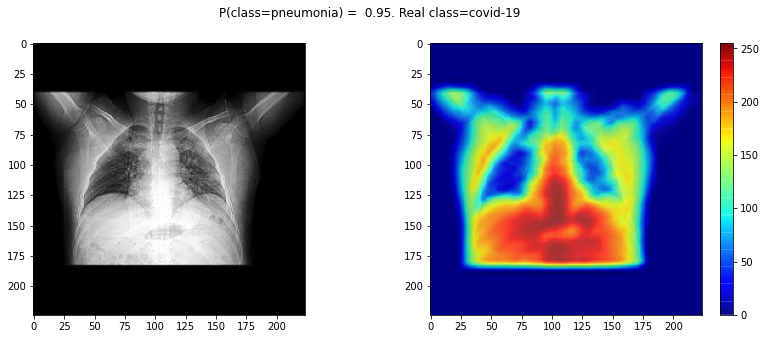

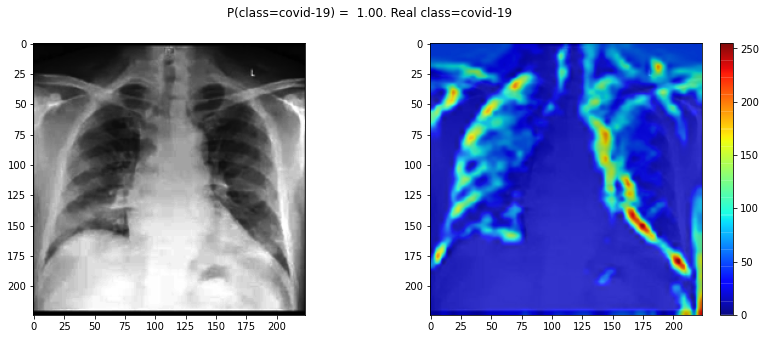

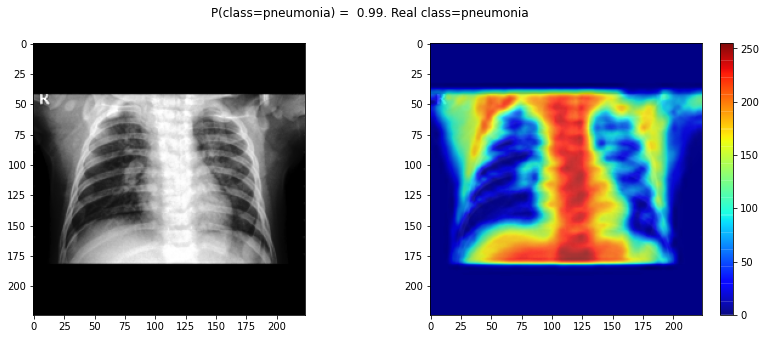

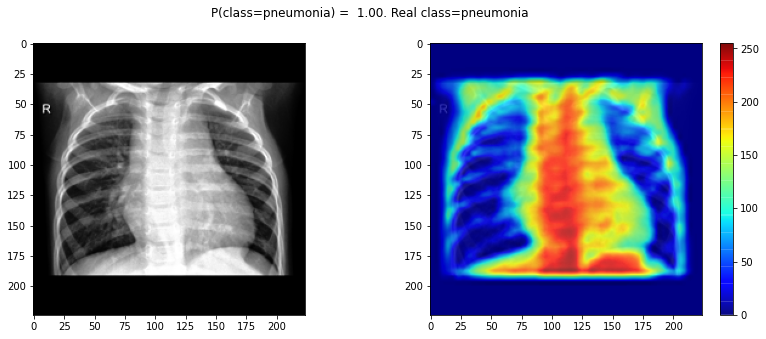

In [ ]:
# Es mostra la classe predita P(class=X) = Probabilitat. I també la classe real.
model_activation_maps(model_1, -1, -5, x_validation, y_validation, 2)

Els resultats mostren que la xarxa possiblement està discriminant característiques de les radiografies en comptes de patrons presents en l'anatomia dels pacients.

Les activacions de cada classe no coincideixen amb el que s'espera del diagnòstic mèdic [R3]. La interpretació visual de les activacions és que aprenen a diferenciar les imatges segons el tipus de radiografia.

Això es pot determinar ja que el mapa d'activació de covid-19 apareix quan cap element de les altres dues classes és present en el pacient. És a dir, detecta covid-19 per exclusió de l'absència de les característiques de les classes healthy i pneumonia.

En conclusió, no es pot determinar si els bons resultats d'aquest model són fruit que les radiografies de cada classe són similars (per exemple, en la forma de prendre's), o si realment existeix una característica fisiològica que les discrimina. És necessari posar a prova altres models per tal de comparar més informació.

## Model 2: VGG16
Donat que l'arquitectura del model 1 sembla que no detecti patrons relacionats amb anormalitats presents en el sistema respiratori, es decideix construir una xarxa neuronal més profunda, que pugui realitzar construccions més abstractes.

En concret, s'utilitza l'arquitectura VGG16 com a punt de partida.

En aquest cas, s'utilitza l'input en format RGB, ja que la xarxa VGG16 accepta únicament aquest format d'entrada. Això és més simple que utilitzar l'input en format d'escala de grisos i aplicar transformacions mitjançant capes personalitzades.

Per tal d'evitar entrenar tots els pesos de la xarxa, s'utilitzen els pesos preentrenats utilitzant el dataset d'imagenet [http://www.image-net.org/]. Es congelen totes les capes convolucionals menys les denses finals, que seran reemplaçades per unes capes denses més adients.

In [ ]:
# Obtenir la xarxa amb els pesos preentrenats
vgg16 = VGG16(weights='imagenet',classes=3, input_tensor=Input(shape=(IMAGE_SIZE, IMAGE_SIZE,3)),include_top=False)
model_2_raw = build_pretrained_model(vgg16)
model_2_raw.summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 224, 224, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0   

In [ ]:
model_2, history_2 = compile_execute_model(model_2_raw, x_train_rgb, y_train_rgb, x_validation_rgb, y_validation_rgb)

Train on 4008 samples, validate on 42 samples
Epoch 1/12
4008/4008 [==============================] - 16s 4ms/step - loss: 2.8894 - accuracy: 0.6994 - val_loss: 0.3585 - val_accuracy: 0.9048
Epoch 2/12
4008/4008 [==============================] - 15s 4ms/step - loss: 0.8591 - accuracy: 0.8645 - val_loss: 0.2784 - val_accuracy: 0.8810
Epoch 3/12
4008/4008 [==============================] - 15s 4ms/step - loss: 0.5165 - accuracy: 0.9074 - val_loss: 0.2282 - val_accuracy: 0.9048
Epoch 4/12
4008/4008 [==============================] - 15s 4ms/step - loss: 0.3338 - accuracy: 0.9227 - val_loss: 0.2039 - val_accuracy: 0.9286
Epoch 5/12
4008/4008 [==============================] - 15s 4ms/step - loss: 0.2806 - accuracy: 0.9379 - val_loss: 0.1648 - val_accuracy: 0.9286
Epoch 6/12
4008/4008 [==============================] - 15s 4ms/step - loss: 0.1918 - accuracy: 0.9513 - val_loss: 0.1637 - val_accuracy: 0.9286
Epoch 7/12
4008/4008 [==============================] - 15s 4ms/step - loss: 0.1586 

In [ ]:
save_model_and_history(model_2, history_2,"model_2")

In [ ]:
model_2, history_2 = load_model_and_history("model_2")

### Validació del model 2
Aquest model obté una major precisió, sembla ser, en validació. Les mètriques relacionades amb la matriu de confusió són les següents:

In [ ]:
evaluate_model(model_2, x_validation_rgb, y_validation_rgb)

Accuracy: 95.24%
Recall (covid-19 vs others): 100.00%
Confusion matrix: 
                pred healthy  pred covid-19  pred pneumonia
real healthy              13              0               1
real covid-19              0             14               0
real pneumonia             1              0              13


El recall assoleix el 100%. A més, no és fruit de classificar totes les instàncies com covid-19, com s'observa en una precisió del 95%.

Aquest model és quasi òptim, ja que el classificador desitjat ha d'intentar maximitzar el recall en la classe covid-19.

Com ha evolucionat el model durant l'entrenament?

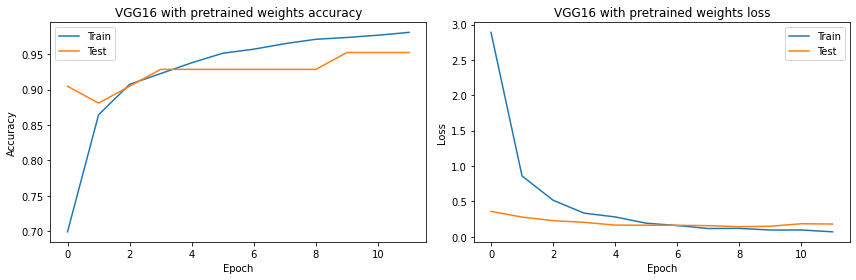

In [ ]:
visualize_model(history_2,"VGG16 with pretrained weights")

La corba del conjunt d'entrenament és l'habitual en una xarxa neuronal. Convergeix molt ràpidament cap al 100%. La precisió del conjunt de validació és molt alta en acabar la primera època, però es manté estable al llarg de l'entrenament.

En definitiva, la xarxa convergeix ràpidament. És possible que el gran nombre d'instàncies d'entrenament influeixin en aquest aspecte.

Es podria relaxar el learning rate si es volgués un entrenament més estable, però no és necessari, ja que com demostren els resultats, no s'observen anomalies massa significatives en l'evolució del conjunt de validació. Només una convergència ràpida.

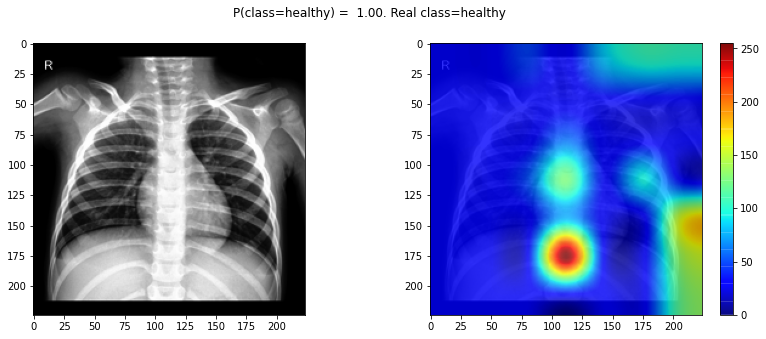

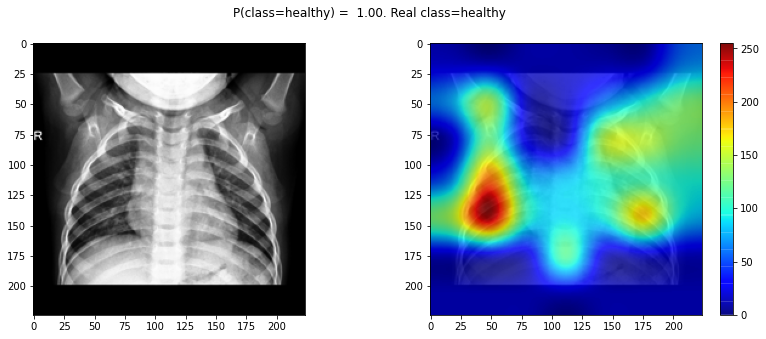

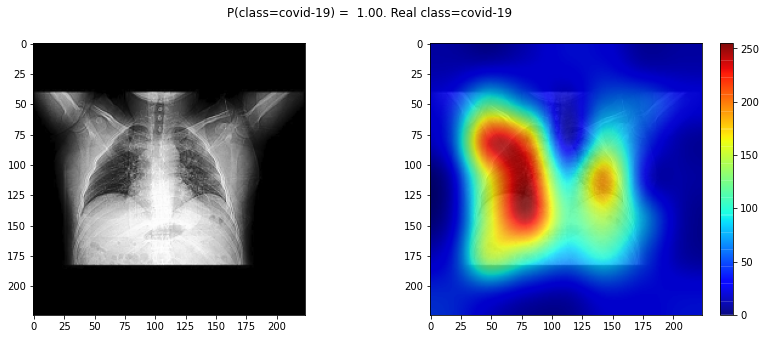

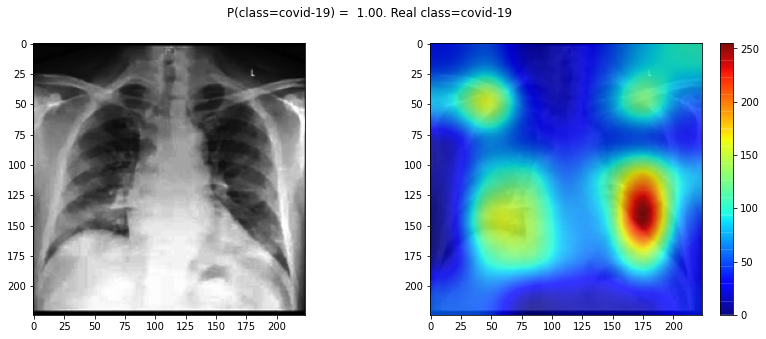

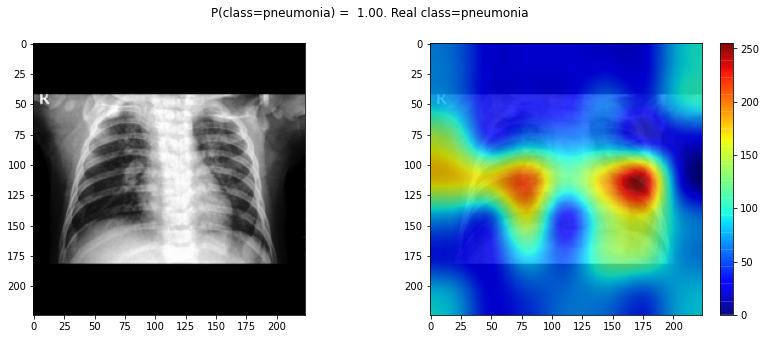

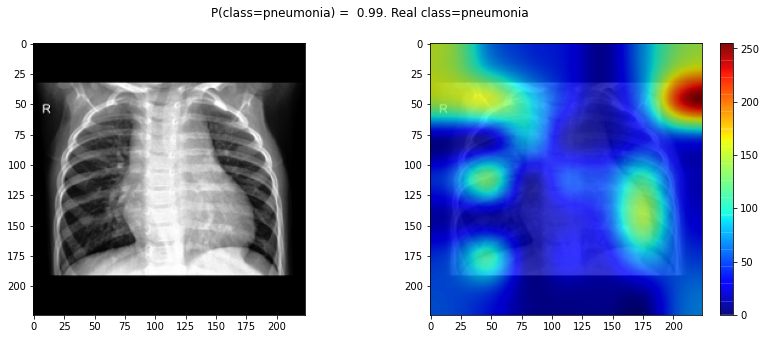

In [ ]:
model_activation_maps(model_2, -1, -5, x_validation_rgb, y_validation_rgb, 2, 'rgb')

Els mapes d'activació són més interessants que el primer model. En aquest cas, es poden visualitzar zones concretes que activen les neurones de l'última capa convolucional.

Si s'observen les diferències entre els mapes d'activació, es pot observar el següent:

1. Les zones d'activació de healthy semblen ser complementàries a les de covid-19 i pneumònia. Això pot ser un indicatiu que la xarxa aprèn a diferenciar una persona sana per exclusió de característiques de les malaltes.
2. covid-19 normalment té una sola zona d'activació. Està situada a l'altura dels pulmons.
3. la pneumònia té diverses zones d'activació, també presents en la caixa toràcica del pacient, però una mica més elevades que les del covid-19.

El fet que es puguin diferenciar les característiques i que aquestes tinguin un relatiu sentit amb el diagnòstic, són punts a favor que la xarxa ha pogut aprendre correctament la funció que diferencia les característiques de les malalties, sense caure en la trampa d'ajustar-se a la forma de la radiografia.

Finalment, pot ser interessant prendre nota de quins són els mapes d'activació de les instàncies que han sigut incorrectament classificades

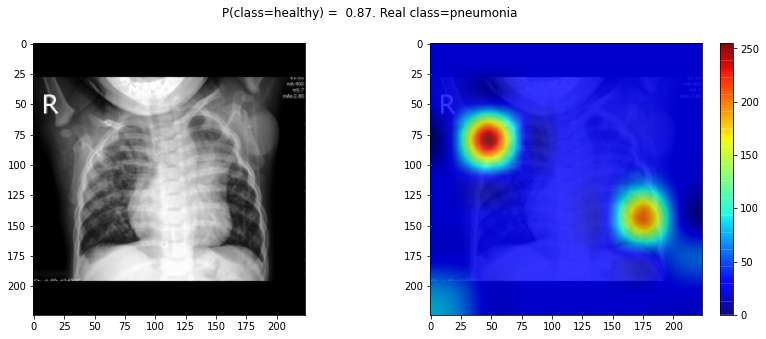

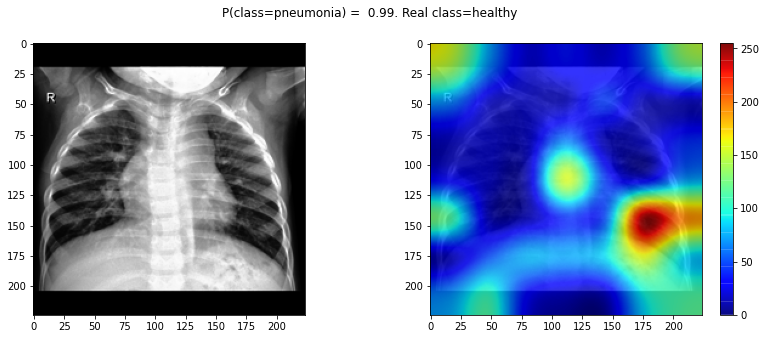

In [ ]:
model_activation_maps_misses(model_2, -1, -5, x_validation_rgb, y_validation_rgb, 3, 'rgb')

## Model 3: VGG19
El següent model que es posa a prova és una VGG19, que en essència es tracta d'una VGG16 amb més profunditat. El procediment és el mateix que el cas anterior.

In [ ]:
# Obtenir la xarxa amb els pesos preentrenats
vgg19 = VGG19(include_top=False, weights="imagenet",input_tensor=Input(shape=(IMAGE_SIZE, IMAGE_SIZE,3)), classes=3)
model_3_raw = build_pretrained_model(vgg19)
model_3_raw.summary()

80142336/80134624 [==============================] - 3s 0us/step
Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 224, 224, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
____________________________________________________________

In [ ]:
model_3, history_3 = compile_execute_model(model_3_raw, x_train_rgb, y_train_rgb, x_validation_rgb, y_validation_rgb)

Train on 4008 samples, validate on 42 samples
Epoch 1/12
4008/4008 [==============================] - 32s 8ms/step - loss: 2.5360 - accuracy: 0.6764 - val_loss: 0.2605 - val_accuracy: 0.9048
Epoch 2/12
4008/4008 [==============================] - 32s 8ms/step - loss: 0.7379 - accuracy: 0.8548 - val_loss: 0.1316 - val_accuracy: 0.9524
Epoch 3/12
4008/4008 [==============================] - 32s 8ms/step - loss: 0.4695 - accuracy: 0.8962 - val_loss: 0.0863 - val_accuracy: 0.9762
Epoch 4/12
4008/4008 [==============================] - 32s 8ms/step - loss: 0.3158 - accuracy: 0.9217 - val_loss: 0.1198 - val_accuracy: 0.9524
Epoch 5/12
4008/4008 [==============================] - 32s 8ms/step - loss: 0.2606 - accuracy: 0.9371 - val_loss: 0.1155 - val_accuracy: 0.9524
Epoch 6/12
4008/4008 [==============================] - 32s 8ms/step - loss: 0.1836 - accuracy: 0.9543 - val_loss: 0.1302 - val_accuracy: 0.9524
Epoch 7/12
4008/4008 [==============================] - 32s 8ms/step - loss: 0.1453 

In [ ]:
save_model_and_history(model_3, history_3,"model_3")

In [ ]:
model_3, history_3 = load_model_and_history("model_3")

### Validació del model 3

In [ ]:
evaluate_model(model_3, x_validation_rgb, y_validation_rgb)

Accuracy: 97.62%
Recall (covid-19 vs others): 100.00%
Confusion matrix: 
                pred healthy  pred covid-19  pred pneumonia
real healthy              13              0               1
real covid-19              0             14               0
real pneumonia             0              0              14


Aquesta vegada la precisió és més alta que l'anterior. A més, el recall és també del 100%. 

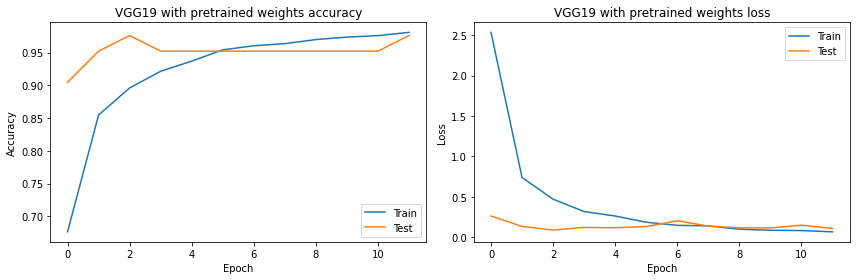

In [ ]:
visualize_model(history_3,"VGG19 with pretrained weights")

La corba d'entrenament és molt similar a les anteriors. Tots els models convergeixen de la mateixa manera. L'evolució en validació és poc determinant, ja que des de les primeres èpoques s'estanca.

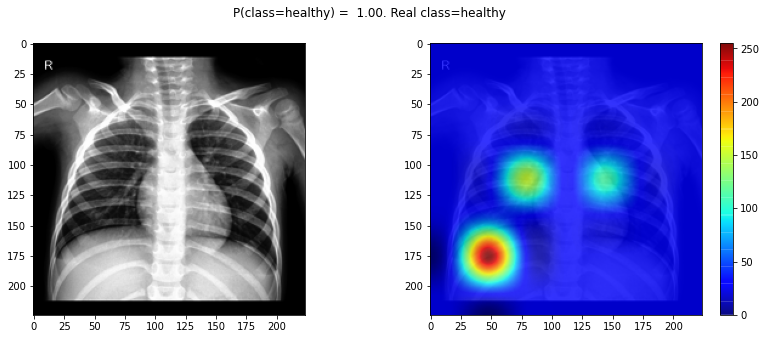

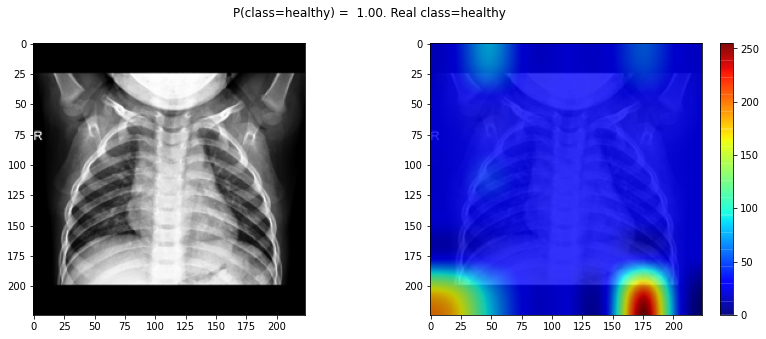

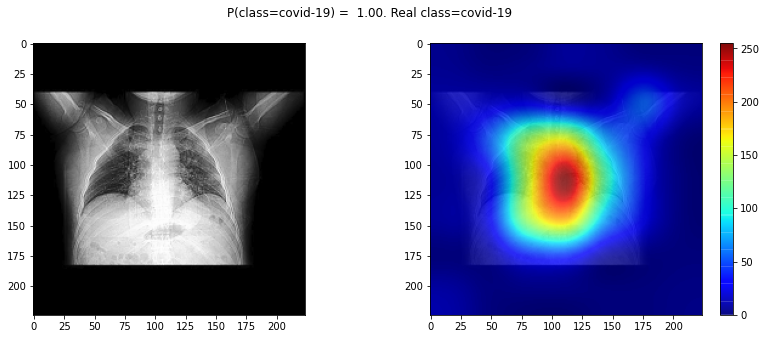

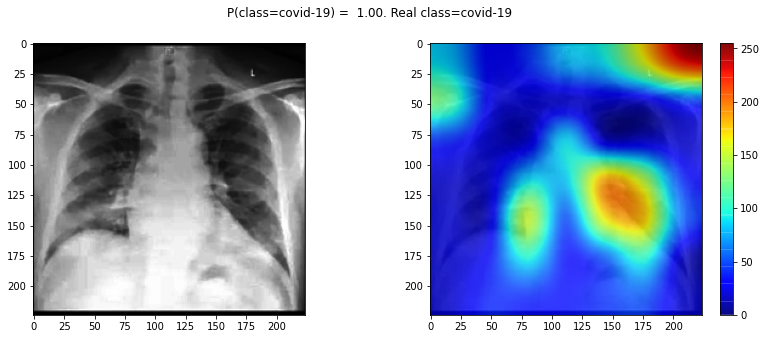

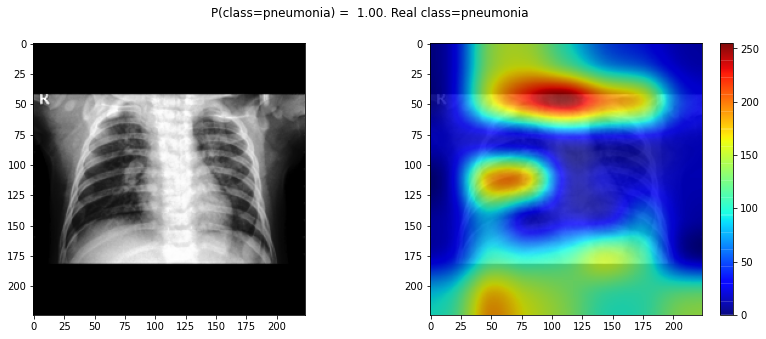

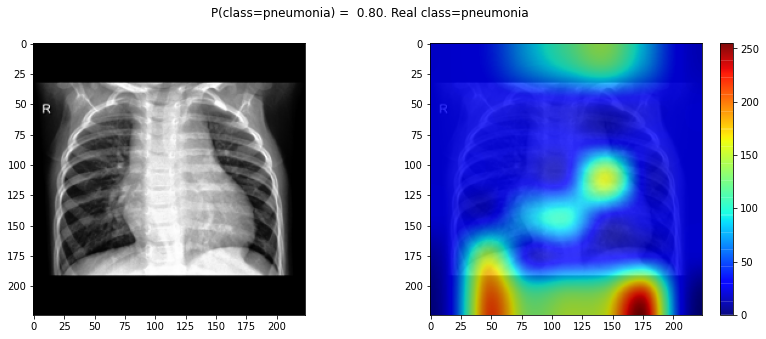

In [ ]:
model_activation_maps(model_3, -1, -5, x_validation_rgb, y_validation_rgb, 2, 'rgb')

Els patrons permeten diferenciar les tres classes, però no resulta possible determinar si la forma de detecció és en acord al diagnòstic humà. En tot cas el model sembla funcionar correctament en validació.

S'observen les instàncies classificades erròniament:

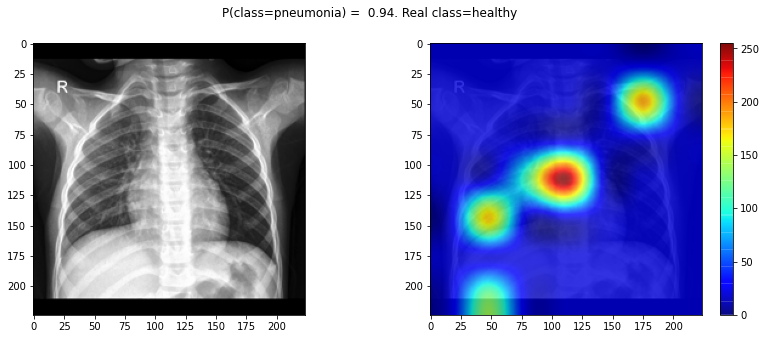

In [ ]:
model_activation_maps_misses(model_3, -1, -5, x_validation_rgb, y_validation_rgb, 3, 'rgb')

## Model 4: VGG19 amb pesos de radiografies

El següent model utilitza l'arquitectura VGG19 amb els pesos preentrenats d'una llibreta publicada a Kaggle [R4].

Originalment, el model fou concebut per a diferenciar entre una persona amb pneumònia o saludable. Per tant, s'han d'adaptar les capes finals de la xarxa perquè actuï com un classificador de 3 classes.

Es canvien les últimes capes (eliminant en gran part les neurones de les capes denses finals). I s'entrena el model congelant les primeres 3 capes convolucionals.

In [ ]:
# Definició del model extreta de la llibreta de Kaggle
def create_model():
    img_input = Input(shape=(224, 224, 3))

    # Block 1
    x = Conv2D(filters=64, kernel_size=(3, 3), padding='same', activation='relu', name='block1_conv1', trainable=False)(img_input)
    x = Conv2D(filters=64, kernel_size=(3, 3), padding='same', activation='relu', name='block1_conv2', trainable=False)(x)
    x = MaxPooling2D(pool_size=(2,2), strides=(2,2), padding='valid', name='block1_pool', trainable=False)(x)

    #Block 2
    x = Conv2D(filters=128, kernel_size=(3,3), padding='same', activation='relu', name='block2_conv1',trainable=False)(x)
    x = Conv2D(filters=128, kernel_size=(3,3), padding='same', activation='relu', name='block2_conv2', trainable=False)(x)
    x = MaxPooling2D(pool_size=(2,2), strides=(2,2), padding='valid', name='block2_pool', trainable=False)(x)

    #Block 3
    x = Conv2D(filters=256, kernel_size=(3,3), padding='same', activation='relu', name='block3_conv1',trainable=False)(x)
    x = Conv2D(filters=256, kernel_size=(3,3), padding='same', activation='relu', name='block3_conv2', trainable=False)(x)
    x = Conv2D(filters=256, kernel_size=(3,3), padding='same', activation='relu', name='block3_conv3', trainable=False)(x)
    x = Conv2D(filters=256, kernel_size=(3,3), padding='same', activation='relu', name='block3_conv4', trainable=False)(x)
    x = MaxPooling2D(pool_size=(2,2), strides=(2,2), padding='valid', name='block3_pool', trainable=False)(x)

    #Block 4
    x = Conv2D(filters=512, kernel_size=(3,3), padding='same', activation='relu', name='block4_conv1')(x)
    x = BatchNormalization(name='block4_bn1')(x)
    x = Conv2D(filters=512, kernel_size=(3,3), padding='same', activation='relu', name='block4_conv2')(x)
    x = BatchNormalization(name='block4_bn2')(x)
    x = Conv2D(filters=512, kernel_size=(3,3), padding='same', activation='relu', name='block4_conv3')(x)
    x = BatchNormalization(name='block4_bn3')(x)
    x = Conv2D(filters=512, kernel_size=(3,3), padding='same', activation='relu', name='block4_conv4')(x)
    x = MaxPooling2D(pool_size=(2,2), strides=(2,2), padding='valid', name='block4_pool')(x)

    #Block 5
    x = Conv2D(filters=512, kernel_size=(3,3), padding='same', activation='relu', name='block5_conv1')(x)
    x = BatchNormalization(name='block5_bn1')(x)
    x = Conv2D(filters=512, kernel_size=(3,3), padding='same', activation='relu', name='block5_conv2')(x)
    x = BatchNormalization(name='block5_bn2')(x)
    x = Conv2D(filters=512, kernel_size=(3,3), padding='same', activation='relu', name='block5_conv3')(x)
    x = BatchNormalization(name='block5_bn3')(x)
    x = Conv2D(filters=512, kernel_size=(3,3), padding='same', activation='relu', name='block5_conv4')(x)
    x = MaxPooling2D(pool_size=(2,2), strides=(2,2), padding='valid', name='block5_pool')(x)
    
    #Other layers
    x = Flatten(name='flatten')(x)
    x = Dense(4096, activation='relu', name='fc1')(x)
    x = Dropout(0.7, name='dropout_1')(x)
    x = Dense(1000, activation='relu', name='fc2')(x)
    x = Dropout(0.7, name='dropout_2')(x)
    x = Dense(512, activation='relu', name='fc3')(x)
    x = Dropout(0.5, name='dropout_3')(x)
    x = Dense(1, activation='sigmoid', name='predictions')(x)
    
    model = Model(inputs=img_input, outputs=x)
    return model


# Crear el model i carregar els pesos preentrenats
imported_vgg19 = create_model()
imported_vgg19.load_weights(get_directory("Weights/vgg_19_best_model.h5"))
# Eliminar les últimes capes denses
for i in range(4):
    imported_vgg19.layers.pop()

# Afegir les noves capes denses, amb menys neurones
x = Dropout(0.25)(imported_vgg19.layers[-4].output)
x = Dense(64, activation='relu', name='dense_out')(x)
x = Dropout(0.25)(x)
x = Dense(3, activation='softmax', name='predictions_1')(x)
model_4_raw = Model(imported_vgg19.input, x)

model_4_raw.summary()

Model: "model_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         (None, 224, 224, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0   

In [ ]:
model_4, history_4 = compile_execute_model(model_4_raw, x_train_rgb, y_train_rgb, x_validation_rgb, y_validation_rgb)

Train on 4008 samples, validate on 42 samples
Epoch 1/12
4008/4008 [==============================] - 64s 16ms/step - loss: 0.2870 - accuracy: 0.8897 - val_loss: 0.2555 - val_accuracy: 0.8810
Epoch 2/12
4008/4008 [==============================] - 61s 15ms/step - loss: 0.0742 - accuracy: 0.9755 - val_loss: 0.2752 - val_accuracy: 0.9048
Epoch 3/12
4008/4008 [==============================] - 61s 15ms/step - loss: 0.0338 - accuracy: 0.9893 - val_loss: 0.3253 - val_accuracy: 0.9048
Epoch 4/12
4008/4008 [==============================] - 61s 15ms/step - loss: 0.0206 - accuracy: 0.9935 - val_loss: 0.3130 - val_accuracy: 0.9286
Epoch 5/12
4008/4008 [==============================] - 61s 15ms/step - loss: 0.0128 - accuracy: 0.9968 - val_loss: 0.4170 - val_accuracy: 0.9048
Epoch 6/12
4008/4008 [==============================] - 61s 15ms/step - loss: 0.0064 - accuracy: 0.9990 - val_loss: 0.4624 - val_accuracy: 0.9286
Epoch 7/12
4008/4008 [==============================] - 61s 15ms/step - loss: 

In [ ]:
save_model_and_history(model_4, history_4,"model_4")

In [ ]:
model_4, history_4 = load_model_and_history("model_4")

### Validacio del model 4

In [ ]:
evaluate_model(model_4, x_validation_rgb, y_validation_rgb)

Accuracy: 92.86%
Recall (covid-19 vs others): 85.71%
Confusion matrix: 
                pred healthy  pred covid-19  pred pneumonia
real healthy              13              0               1
real covid-19              0             12               2
real pneumonia             0              0              14


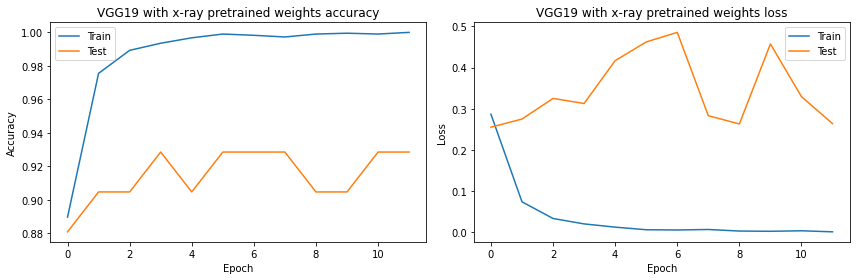

In [ ]:
visualize_model(history_4,"VGG19 with x-ray pretrained weights")

Els resultats no són tan bons com els models anteriors. Sembla que utilitzar uns pesos preentrenats fruit de la font externa no és tan eficaç com utilitzar els pesos d'imaget. És possible que les radiografies d'entrada del model preentrenat no fossin gaire similars a les utilitzades en aquesta pràctica. També pot passar que el model no sigui el més adequat.

La precisió és bastant alta però el recall no arriba al 100%, que sí assoleixen els models VGG16 i VGG19 amb imagenet.

La xarxa té un bias cap a la predicció de pneumònia, com mostra la matriu de confusió.

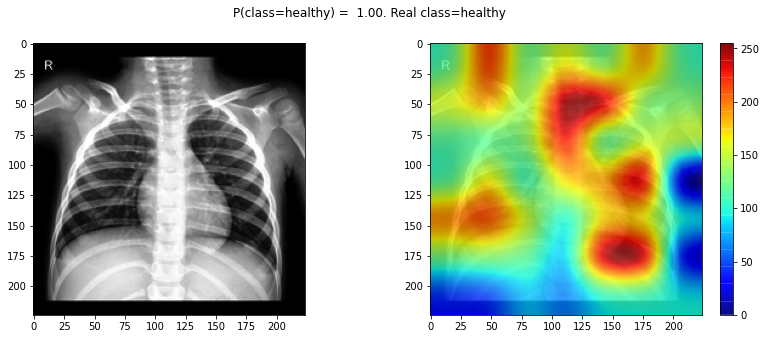

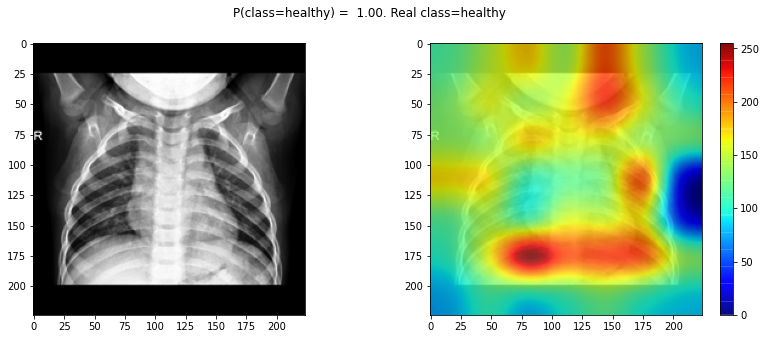

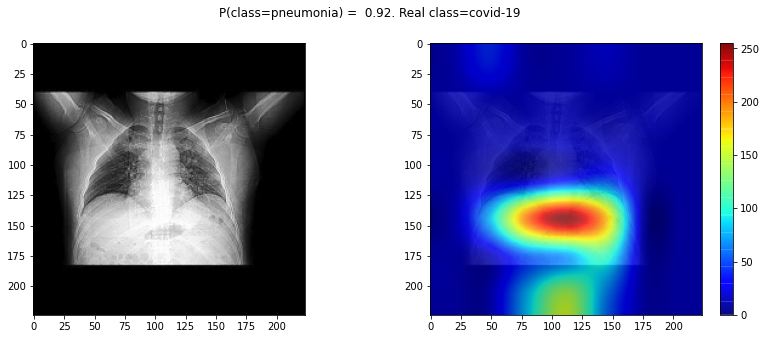

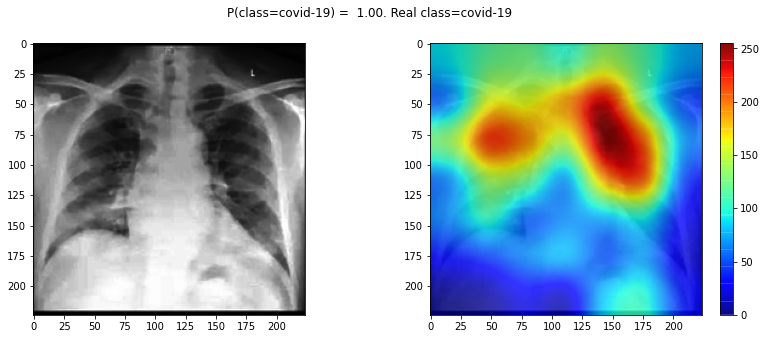

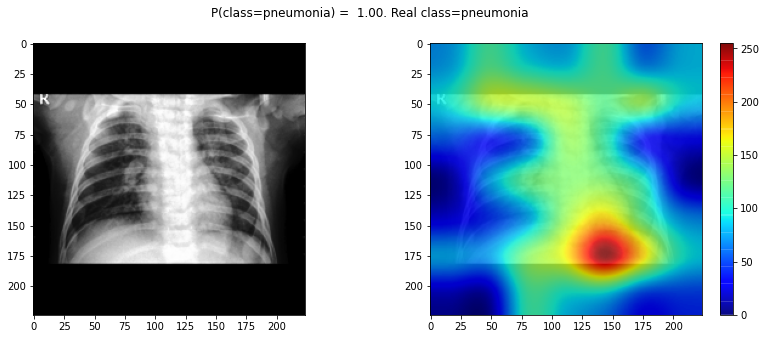

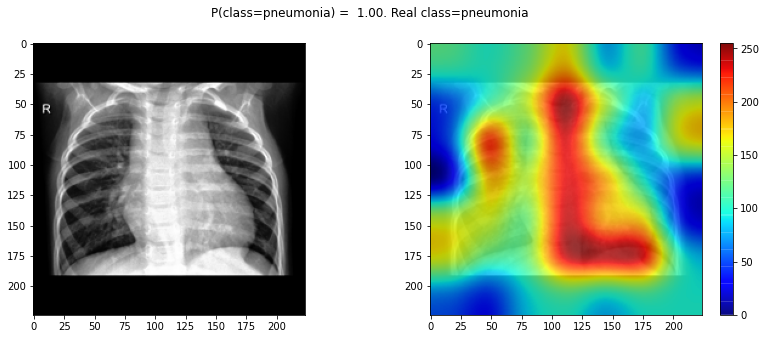

In [ ]:
model_activation_maps(model_4, -1, -5, x_validation_rgb, y_validation_rgb, 2, 'rgb')

Els mapes d'activació són similars als anteriors. Es pot arribar a inferir que la xarxa és capaç de detectar patrons en l'anatomia de la persona, encara que alguns mapes (com el de predicció de healthy), no mostren cap estructura.

Es poden observar les errades, per tal d'obtenir informació complementària.

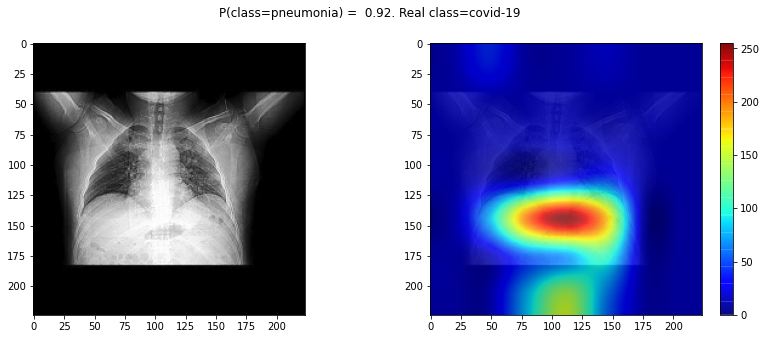

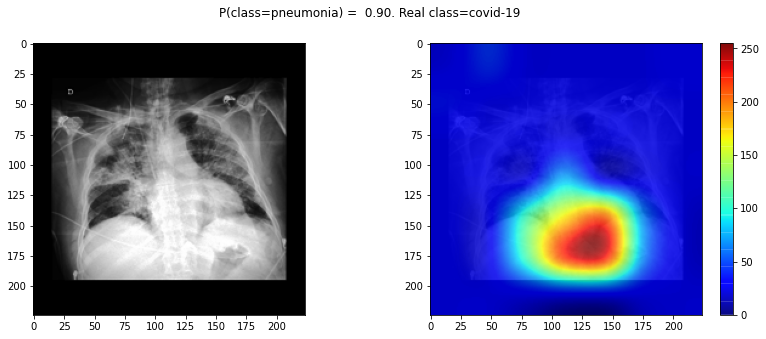

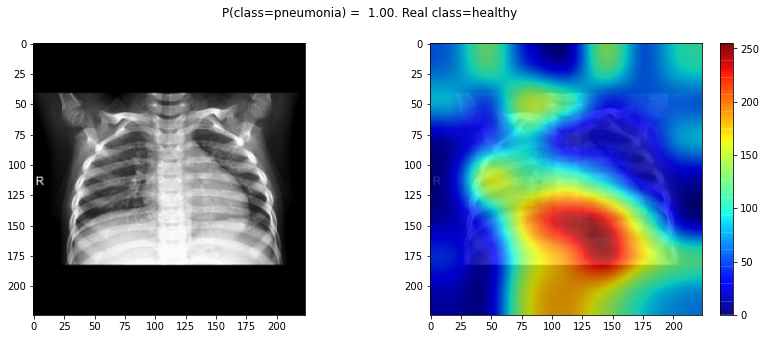

In [ ]:
model_activation_maps_misses(model_4, -1, -5, x_validation_rgb, y_validation_rgb, 3, 'rgb')

La pneumònia es detecta a partir d'un patró que es troba al voltant el diafragma. En les tres imatges anteriors aquest patró es malinterpreta (presumptament).

## Model 5: Xception
L'última arquitectura proposada és Xception. Aquesta arquitectura és una variació d'Inception, però assumint que la correlació entre els canals i l'espai no és significativa.

Aquest model s'inicialitza amb els pesos d'imagenet, però no es congelen les capes. Anteriorment s'ha comprovat que congelar les capes convolucionals impossibilitava el correcte desenvolupament del model en validació.


In [ ]:
# Obtenir la xarxa amb els pesos preentrenats
xception = Xception(weights='imagenet',classes=3, input_tensor=Input(shape=(IMAGE_SIZE, IMAGE_SIZE,3)),include_top=False)
model_5_raw = build_pretrained_model(xception, not_freeze=True)
model_5_raw.summary()

83689472/83683744 [==============================] - 3s 0us/step
Model: "model_4"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            (None, 224, 224, 3)  0                                            
__________________________________________________________________________________________________
block1_conv1 (Conv2D)           (None, 111, 111, 32) 864         input_3[0][0]                    
__________________________________________________________________________________________________
block1_conv1_bn (BatchNormaliza (None, 111, 111, 32) 128         block1_conv1[0][0]               
__________________________________________________________________________________________________
block1_conv1_act (Activation)   (None, 111, 111, 32) 0           block1_conv1_bn[0][0]            
___________________________

In [ ]:
model_5, history_5 = compile_execute_model(model_5_raw, x_train_rgb, y_train_rgb, x_validation_rgb, y_validation_rgb)

Train on 4008 samples, validate on 42 samples
Epoch 1/12
4008/4008 [==============================] - 148s 37ms/step - loss: 0.3123 - accuracy: 0.8780 - val_loss: 0.1365 - val_accuracy: 0.9524
Epoch 2/12
4008/4008 [==============================] - 135s 34ms/step - loss: 0.0594 - accuracy: 0.9805 - val_loss: 0.1521 - val_accuracy: 0.9524
Epoch 3/12
4008/4008 [==============================] - 135s 34ms/step - loss: 0.0267 - accuracy: 0.9910 - val_loss: 0.1866 - val_accuracy: 0.9524
Epoch 4/12
4008/4008 [==============================] - 135s 34ms/step - loss: 0.0152 - accuracy: 0.9950 - val_loss: 0.1571 - val_accuracy: 0.9524
Epoch 5/12
4008/4008 [==============================] - 135s 34ms/step - loss: 0.0066 - accuracy: 0.9983 - val_loss: 0.1647 - val_accuracy: 0.9524
Epoch 6/12
4008/4008 [==============================] - 135s 34ms/step - loss: 0.0072 - accuracy: 0.9978 - val_loss: 0.1698 - val_accuracy: 0.9524
Epoch 7/12
4008/4008 [==============================] - 134s 33ms/step -

In [ ]:
save_model_and_history(model_5, history_5,"model_5")

In [ ]:
model_5, history_5 = load_model_and_history("model_5")

### Validació del model 5


In [ ]:
evaluate_model(model_5, x_validation_rgb, y_validation_rgb)

Accuracy: 95.24%
Recall (covid-19 vs others): 100.00%
Confusion matrix: 
                pred healthy  pred covid-19  pred pneumonia
real healthy              13              0               1
real covid-19              0             14               0
real pneumonia             1              0              13


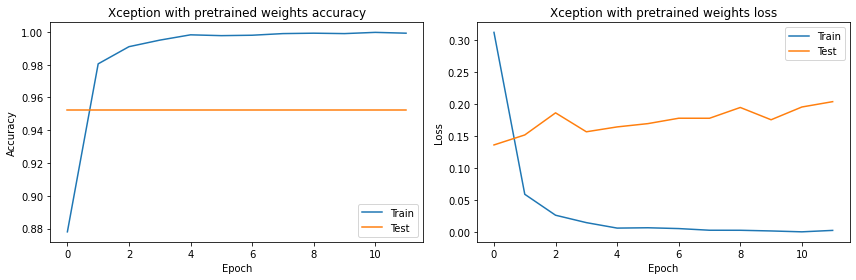

In [ ]:
visualize_model(history_5,"Xception with pretrained weights")

El model obté la mateixa precisió que VGG16. La primera època és suficient per a assolir la màxima precisió en el conjunt de validació.

El recall també és perfecte. Per tal de diferenciar-lo d'altres models, es visualitzen alguns mapes d'activació:

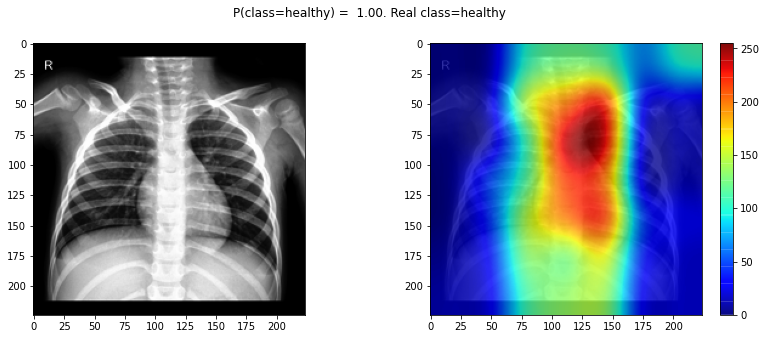

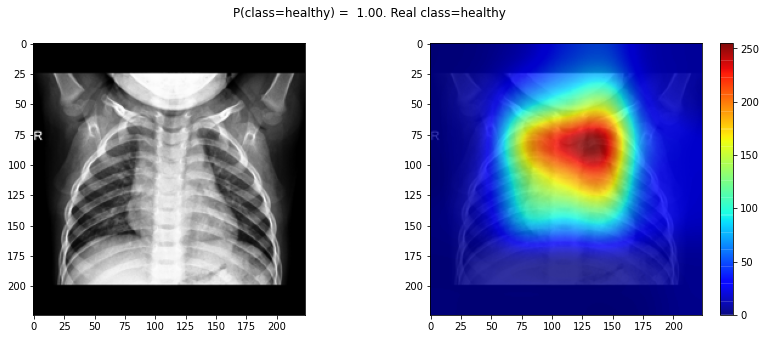

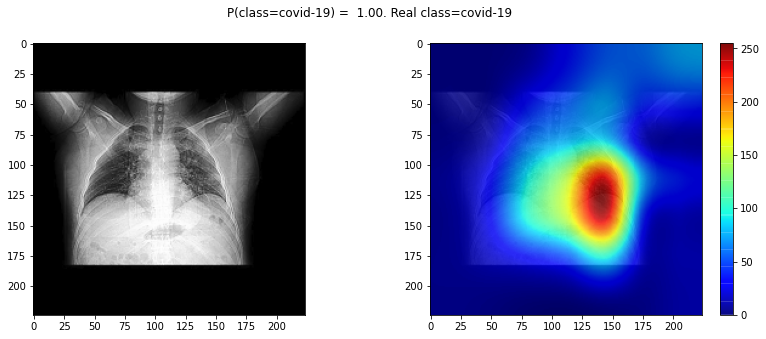

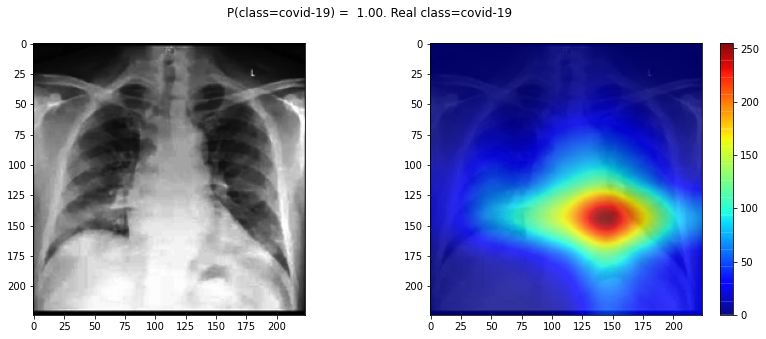

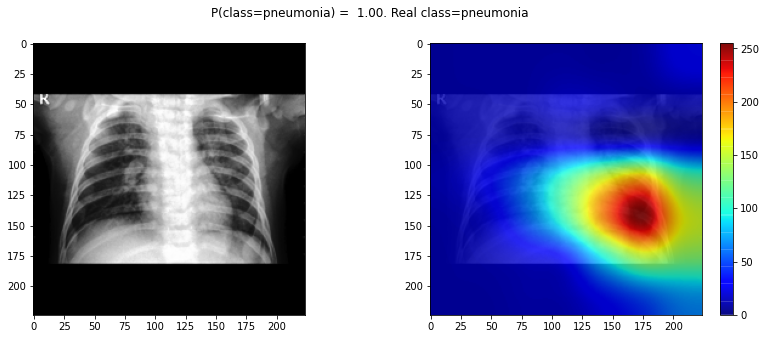

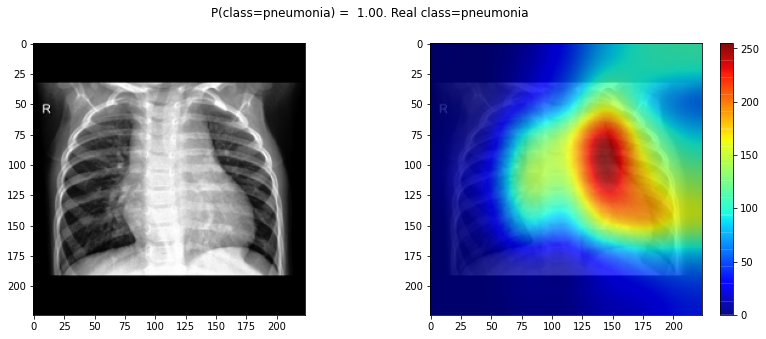

In [ ]:
# Mapes d'activacions per cada classe
model_activation_maps(model_5, -1, -6, x_validation_rgb, y_validation_rgb, 2, 'rgb')

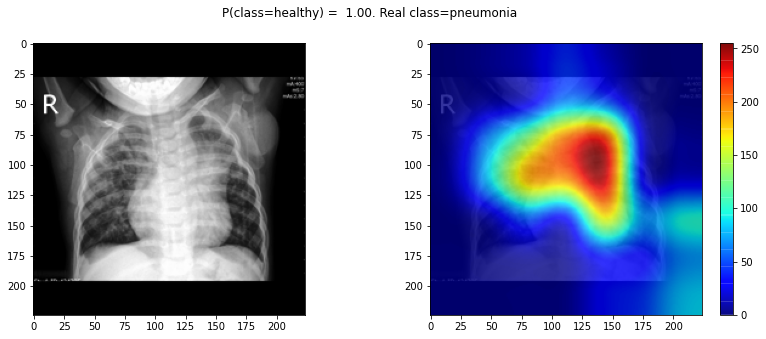

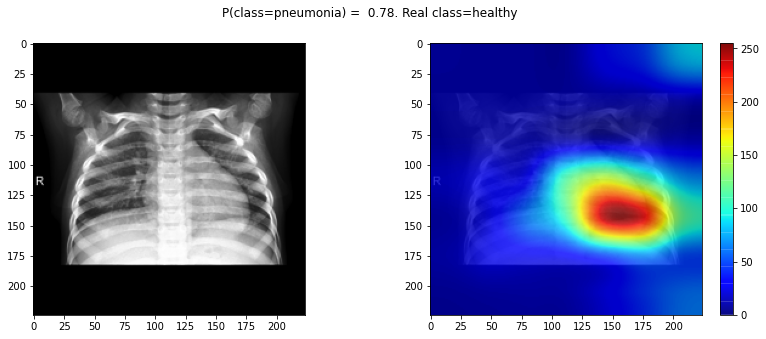

In [ ]:
# Mapes d'activacions de les fallades
model_activation_maps_misses(model_5, -1, -6, x_validation_rgb, y_validation_rgb, 2, 'rgb')

Aquesta arquitectura produeix uns mapes d'activació més raonables que les anteriors. Per al covid-19 i la pneumònia, es detecten íntegrament parts de la caixa toràcica, sense que s'activin en gran manera zones redundants com el braç o els marges.

# 5 Resultats i Conclusions 

En aquesta secció cal implementar la fase de test dels millors models desenvolupats i entrenants en la fase anterior. 

Es valoraran aspectes com:

- Raonament de quina arquitectura és la més adecuada
- Anàlisis quantitatiu i qualitatiu dels resultats

## Resultats
El resum de les arquitectures proposades en l'apartat anterior és el següent:

La primera arquitectura proposada consisteix en una xarxa convolucional bàsica amb poca profunditat. Té com a propòsit ser un punt de partida per analitzar les diferències amb xarxes més profundes.

Aquesta arquitectura ha resultat en una precisió i recall (covid-19 vs all) bastant alts (~85%). Però, després d'observar els mapes d'activació de l'´última capa convolucional, es determina que els patrons que es detecten no són relacionats amb el problema que es pretén resoldre.

Entrenant una xarxa simple, les capes intenten aprendre una funció per a diferenciar una radiografia d'una altra segons característiques com el marge, l'aparició de certs elements o anotacions, el tipus de pacient...

Aquestes característiques no són adequades per a realitzar el diagnòstic del covid-19. Per tant, el primer model, encara que obté uns bons resultats en el conjunt de validació, no ho realitza a través de característiques que es poden considerar correctes per al diagnòstic mèdic.

Tot seguit, s'han realitzat tres implementacions diferents de l'arquitectura VGG. Aquestes s'han realitzat amb unes dades d'entrenament diferents de les del model anterior, ja que requerien una entrada de tres canals (RGB). L'única diferència entre els dos sets d'entrenament és que un té un sol canal (normalitzat) i l'altre té aquest canal replicat en els tres de color (sense normalitzar). La magnitud del color és la mateixa en escala de grisos o en escala RGB.

La primera implementació, VGG16, ha utilitzat els pesos preentrenats mitjançant el dataset "imagenet" per a totes les capes convolucionals. Per tal d'adaptar la sortida al problema de classificació, s'han canviat les últimes capes denses del model per unes més simples i ajustades al nombre de classes del problema, tres. Les capes convolucionals s'han congelat durant la fase d'entrenament. 

Amb aquest model, s'ha obtingut un recall del 100% en covid i una precisió molt alta (95%) en validació. Els mapes d'activació d'aquest model eren diferents als del primer. Es podien diferenciar patrons dels pacients.

La segona, VGG19, una versió més profunda de VGG19, s'ha preparat i executat de la mateixa manera que l'anterior. Els resultats han sigut lleugerament més bons. El recall ha sigut el mateix (100%), però la precisió global ha millorat, classificant una instància més com a correcte.

El tercer model consistia en una arquitectura similar a la VGG19, però utilitzant uns pesos preentrenats a partir d'una llibreta de Kaggle, que tenia com a propòsit detectar els casos de pneumònia (classificació binària). El model s'ha adaptat per al problema d'aquesta pràctica. Només s'han congelat les primeres capes convolucionals de la xarxa, en aquest cas.

Els resultats d'aquest tercer model VGG no han sigut tan bons com els anteriors. Un recall del 85% dista molt del valor perfecte dels altres dos. La causa és un bias a predir pneumònia, que empitjora molt la mètrica del recall, ja que s'obtenen falsos negatius de covid-19.

Tot seguit, s'ha posat a prova el rendiment de l'arquitectura Xception en aquest problema. Ha resultat en unes mètriques de rendiment iguals a les de l'arquitectura VGG16 per al conjunt de validació. És a dir, recall del 100% i precisió del 95%. La xarxa ha estat preentrenada amb els pesos d'imagenet, però aquesta vegada no s'han congelat durant la fase d'entrenament.

## Models més adeqüats
Per tal de triar el model més adequat, s'han de tenir en compte diversos factors:

1. Quin recall obté el classificador en la classe covid-19 vs les altres.
2. Quina és la precisió del model de forma global.
3. Quins patrons detecta la xarxa neuronal que provoquen la classificació de cada classe.

En primer lloc, el model bàsic (sense profunditat en les capes convolucionals), no és el més adequat per a donar resposta al problema, ja que la xarxa no és prou profunda per a detectar les característiques que poden donar suport al diagnòstic. Aquest model actua com un classificador de radiografies.

En segon lloc, per triar el millor model d'entre tots, s'ha d'avaluar el seu rendiment en el conjunt de test, que s'espera que sigui similar al de validació. Però, el conjunt de test no s'ha fet servir per a trobar els paràmetres més adequats per a l'entrenament, pel que és més independent que el de validació.

Així doncs, dins de la classe VGG, s'escull quin model concret és més indicat per a la tasca de classificació. Es descarta el model preentrenat amb radiografies per una diferència de rendiment massa significativa amb les seves contrapartides.


**Resultats de VGG16 en test (model 2)**

In [ ]:
evaluate_model(model_2, x_test_rgb, y_test_rgb)

Accuracy: 93.33%
Recall (covid-19 vs others): 93.33%
Confusion matrix: 
                pred healthy  pred covid-19  pred pneumonia
real healthy              15              0               0
real covid-19              0             14               1
real pneumonia             2              0              13


**Resultats de VGG19 en test (model 3)**

In [ ]:
evaluate_model(model_3, x_test_rgb, y_test_rgb)

Accuracy: 91.11%
Recall (covid-19 vs others): 100.00%
Confusion matrix: 
                pred healthy  pred covid-19  pred pneumonia
real healthy              14              0               1
real covid-19              0             15               0
real pneumonia             2              1              12


La precisió és més alta en VGG16, però el recall és major en VGG16. Donat que la importància del model radica en maximitzar el recall de covid-19 vs all, el model VGG19 és el més adequat dins de la família d'arquitectures VGG posades a prova.

Per l'altra banda, s'ha de comparar aquest model amb Xception, que també ha proporcionat molt bons resultats en validació.

**Resultats de Xception en test (model 5)**

In [ ]:
evaluate_model(model_5, x_test_rgb, y_test_rgb)

Accuracy: 91.11%
Recall (covid-19 vs others): 100.00%
Confusion matrix: 
                pred healthy  pred covid-19  pred pneumonia
real healthy              14              0               1
real covid-19              0             15               0
real pneumonia             2              1              12


VGG19 i Xception obtenen exactament els mateixos resultats. El recall és el màxim en ambdós models, i la precisió arriba al 90%.

Per tant, s'ha de recórrer als mapes d'activació i judici expert per tal de determinar quin model resulta més indicat dels dos.

S'intenten analitzar les diferències entre els mapes d'activació d'un i l'altre model, però tot el que pugui sorgir d'aquesta anàlisi no és sota cap mena de ciència certa, la veritat. Només s'intenta analitzar què estan detectant les xarxes a l'hora d'emetre un judici.

Es comparen els mapes d'activació els dos models. A l'esquerra, la imatge original. Al centre, el model VGG19. A la dreta, Xception.

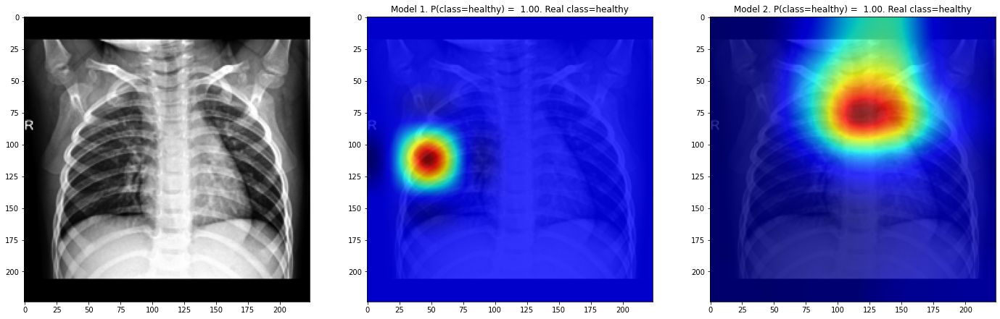

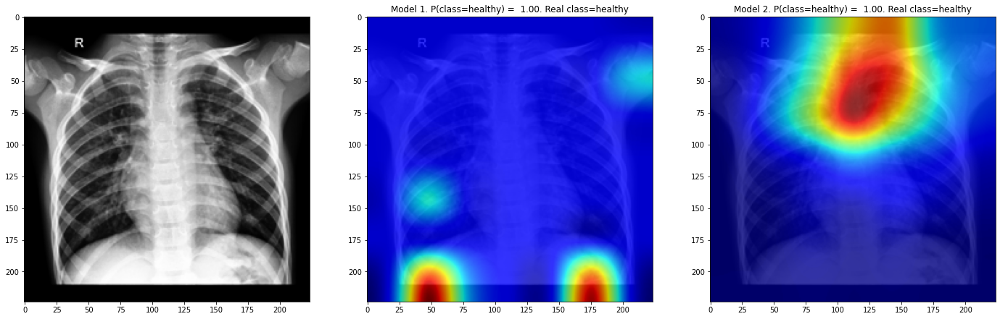

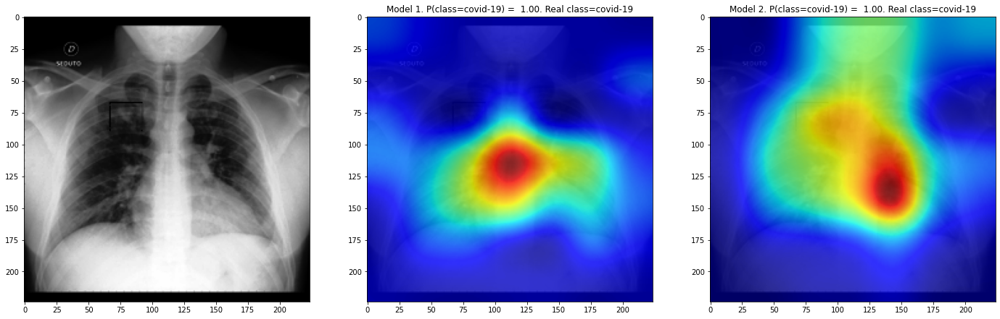

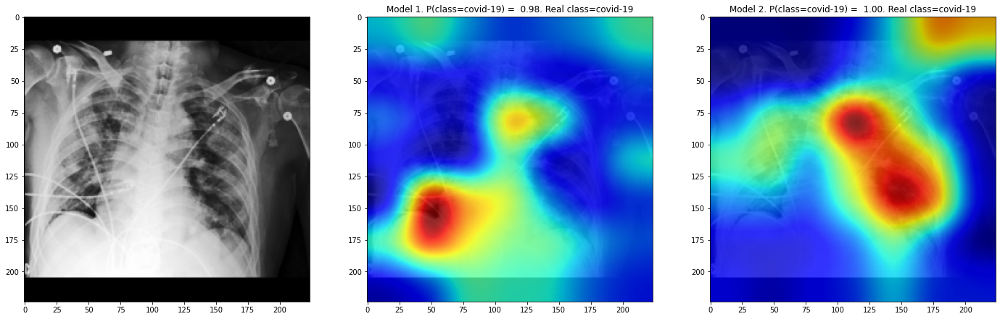

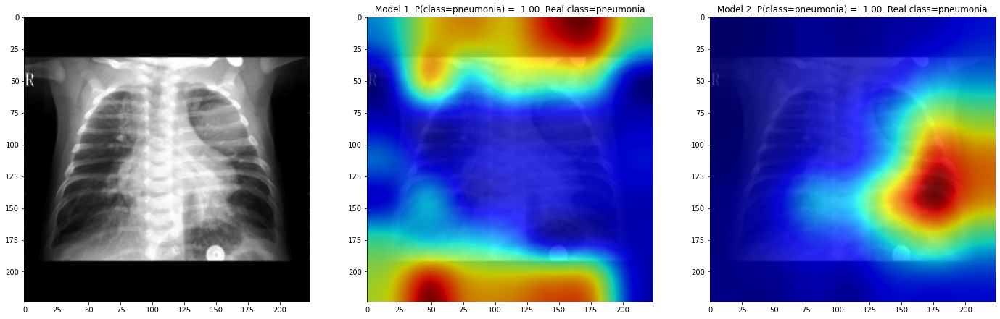

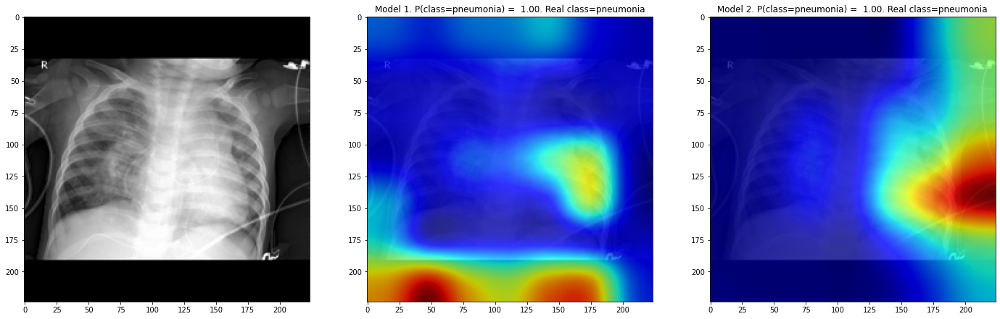

In [ ]:
models_activation_maps(model_3, model_5, -6,-6,x_test_rgb, y_test_rgb, 2)

Sembla que els mapes d'activació de VGG19 cerquen múltiples característiques, a vegades fins i tot en diferents parts de la imatge per una mateixa classe. Per exemple, la pneumònia s'activa en gran manera fora els marges de la imatge. Aquest no és un bon indicador, sense necessitat de conèixer les parts involucrades en el diagnòstic real.

Xception no presenta aquest problema. Els patrons que es visualitzen en el conjunt de test es presenten sobre elements concrets de la radiografia. Les prediccions produeixen uns mapes d'activació similars entre les radiografies de la mateixa classe.

Així doncs, a partir de la visualització dels mapes d'activació, es conclou que el model més adequat per a resoldre el problema de la detecció de covid-19 és l'arquitectura Xception.

Per tal d'entrenar el model Xception, s'han substituït les últimes capes denses pel següent esquema:

1. Dropout del 25%.
2. Capa densa de 64 neurones amb activació relu.
3. Dropout del 25%.
4. Capa densa de prediccions (3 neurones) amb activació softmax.

Els pesos inicials s'han obtingut d'imagenet. No s'ha congelat cap capa durant la fase d'entrenament.

## Conclusions
En aquesta pràctica s'ha realitzat una recerca per aconseguir un model d'una xarxa neuronal capaç de classificar radiografies de pacients en tres classes diferents: saludable, covid-19 i pneumònia.

En primer lloc, s'ha dut a terme una fase de preprocessat de les imatges. L'objectiu d'aquesta fase és incrementar el rendiment de la xarxa neuronal, tant en la fase d'entrenament com en la d'avaluació.

Per fer-ho, s'han processat les imatges d'entrada. Les accions més importants que s'han realitzat han sigut:

1. Corregir el contrast de totes les radiografies per tal d'obtenir una similitud més elevada en les dades d'entrada per a les característiques iguals entre radiografia i radiografia.
2. Escalar, retallar i ajustar les imatges adequadament per a poder servir com a entrada d'una xarxa neuronal convolucional.
3. Generar dades sintètiques de diferents mides i rotacions, per tal que les xarxes generalitzin millor.

El resultat ha sigut un augment el dataset d'entrenament original en un factor de 10.

En segon lloc, s'han posat a prova diferents models de xarxes convolucionals. L'objectiu d'aquesta fase era trobar els millors models per al problema proposat. La cerca dels paràmetres més adequats per cada model s'ha realitzat mitjançant l'avaluació dels resultats sobre un conjunt de validació.

Per tal d'avaluar els models, s'ha utilitzat principalment la mètrica del recall (covid-19 vs all), que maximitza els verdaders positius i minimitza els falsos negatius de covid-19. Els resultats s'han analitzat de forma complementària utilitzant la matriu de confusió i els mapes d'activació de l'última capa convolucionals de cada model.

Després d'entrenar i avaluar tots els models, s'obtenen les observacions següents:

1. Les xarxes convergeixen molt ràpidament en validació. En les primeres èpoques ja s'arriba a una precisió molt alta. Èpoques següents no milloren substancialment aquesta precisió. Això pot ser degut al fet que la quantitat de dades d'entrenament és molt alta.
2. Utilitzar pesos preentrenats d'un classificador pneumònia-vs-healthy no ha resultat millor que congelar els pesos d'imagenet per a les arquitectures VGG.
3. Utilitzar poques capes convolucionals provoca que el model sigui capaç de classificar amb bastant precisió el conjunt de validació, però ho realitza a través de la forma de la radiografia. Això és un indicador que pot existir un bias en les dades d'entrada cap al tipus de radiografia segons la classe.
4. Els mapes d'activació generats pels models només es poden arribar a interpretar amb el suport d'especialistes en diagnòstic d'aquest tipus de malalties. Només es pot inferir que un model no classifica adequadament quan els mapes d'activació pertanyen a zones de la radiografia fora del cos humà (p. ex. els marges, o aparells connectats al pacient).
5. El recall, en la majoria de models profunds, assoleix el 100% en validació.

Després de seleccionar els 3 millors models, s'han avaluat sobre el conjunt de test (diferent del de validació). D'entre ells, Xception i VGG19 han obtingut la màxima puntuació en la mètrica del recall (obtenint una precisió bastant alta de forma global). A més, la seva matriu de confusió era exactament igual en ambdós casos.

Per tal de desempatar, s'ha recorregut a l'anàlisi dels mapes d'activació dels models sobre el conjunt de test. A partir d'un judici personal de les visualitzacions, es determina que el model Xception és més adequat que el VGG19.

Encara que el model obtingui bons resultats, s'ha de tenir en compte que el classificador pot no ser correcte per un d'aquests motius:

1. Les imatges d'entrenament, test i validació poden contenir bias. Un exemple de bias és que totes les persones healthy són nadons, i que totes les persones malaltes tenen més de trenta anys. En un cas per l'estil, la xarxa neuronal es pot estar decantant per donar pes a una característica que pot no ser certa per al diagnòstic del covid-19.
2. La xarxa neuronal pot estar aprenent característiques que no formen part del diagnòstic. De forma complementària al cas anterior, aquest problema pot sorgir encara que el set d'imatges sigui divers i sense bias. La configuració de la xarxa pot no ser l'adequada per a detectar les veritables característiques que complementen al diagnòstic.

No és possible determinar si cap d'aquestes dues casualitats es donen en el model seleccionat. Seria necessari el judici d'un expert per a refusar el model o bé acceptar-lo sota una certa confiança.

# *Explainability* 


Investiga sobre les tècniques que es fan servir per entendre les decicions d'una CNN. Per exemple, Els [Class Activation Maps](https://arxiv.org/pdf/1512.04150.pdf) (CAM)[R4] són una modificació en l'arquitectura d'una CNN de classificació de imatges que ens permet visualitzar quines parts de la imatge es consideren per classificar una classe amb una determinada etiqueta. Variacions de les CAMS s'han aplicat recentment per entendre el comportament de les xarxes per detectar Covid19[8].

Una altre mètode és el popular [Deep Dream](https://deepdreamgenerator.com/)[11]. Aquest mètode, a part de generar imatges amb un estil bastant artístic/psicodèlic, serveix per entendre el tipus de característiques que una xarxa busca en la imatge d'entrada per classificar-la amb una determinada etiqueta.

Implementa alguna tècnica de visualització per intentar entendre les decisions de la CNN entrenada.

Durant la realització de la pràctica s'ha incorporat la tècnica de visualització de Class Activation Maps per tal d'entendre millor els models proposats, així com validar el seu rendiment.

Així i tot, es mostren alguns mapes d'activació del conjunt de test sota l'arquitectura guanyadora, Xception (els 5 primers de cada classe).

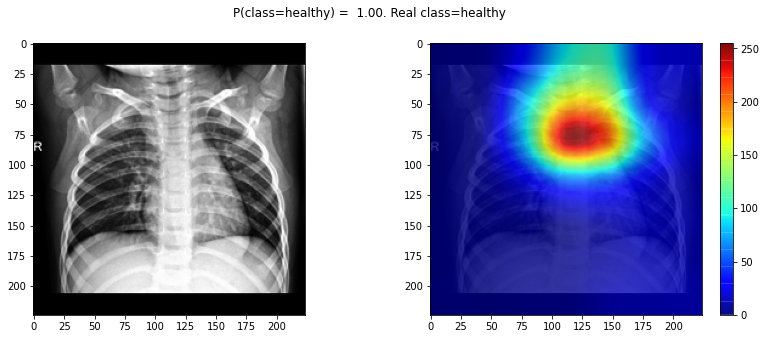

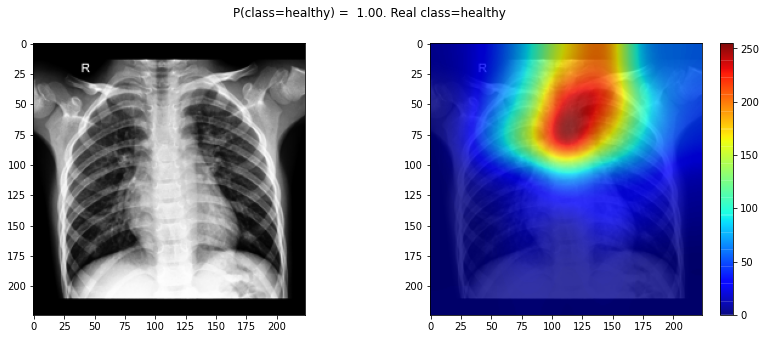

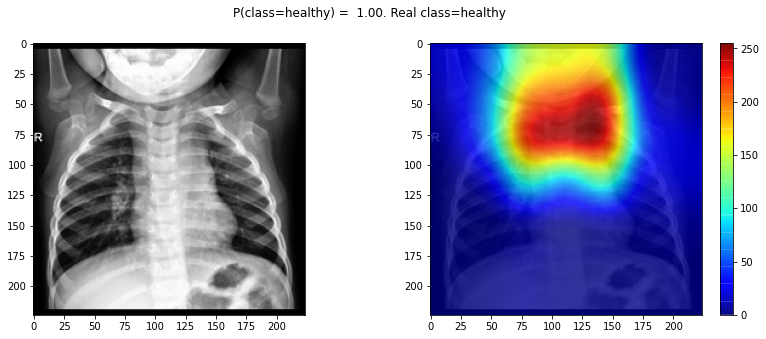

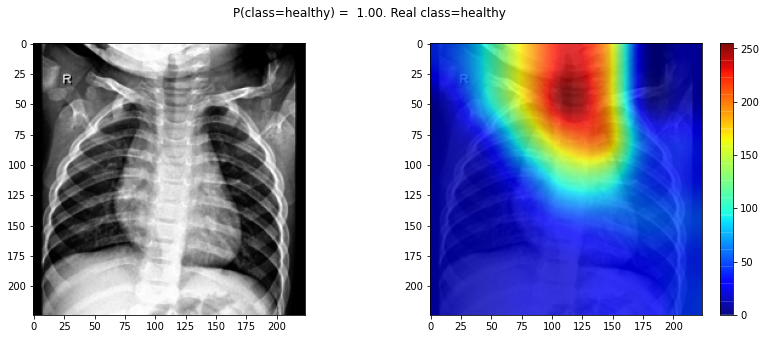

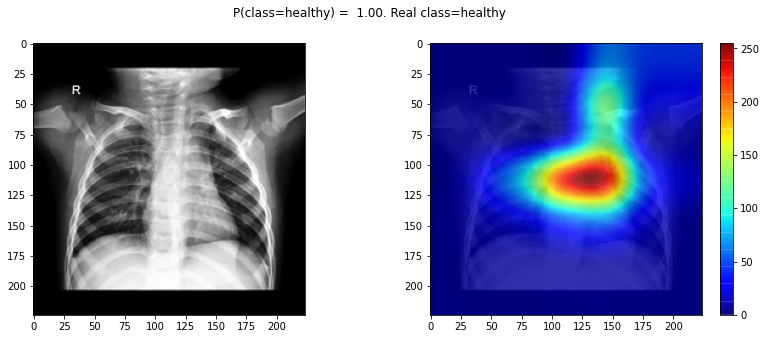

...

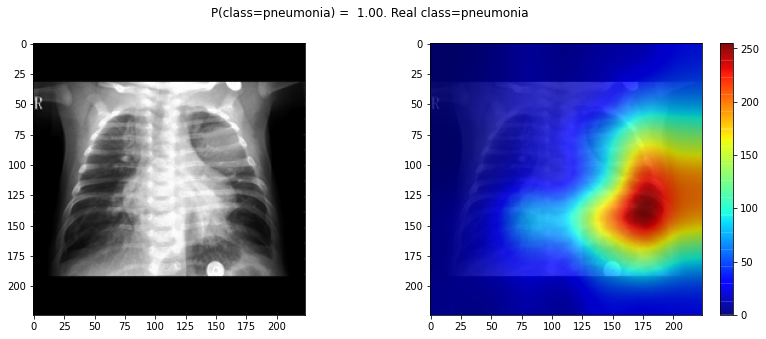

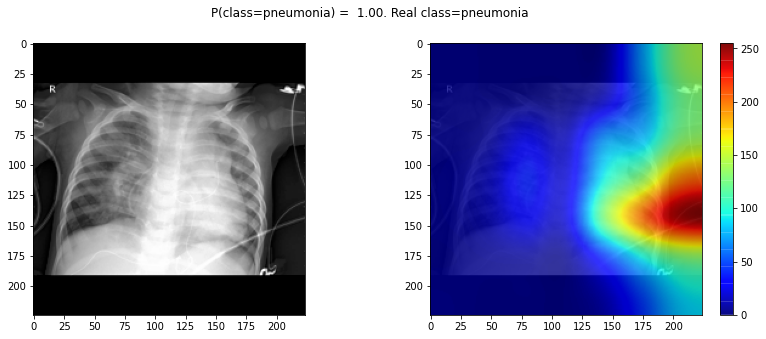

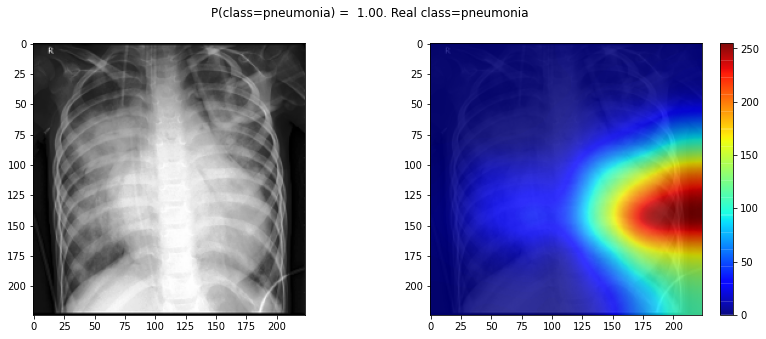

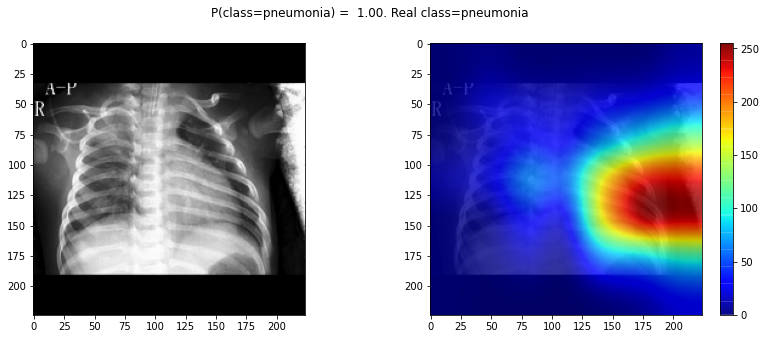

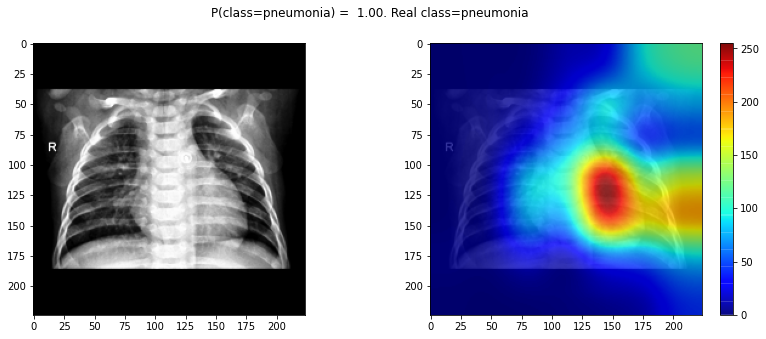

In [ ]:
model_activation_maps(model_5, -1, -6, x_test_rgb, y_test_rgb, 5, 'rgb')

Gràcies als mapes d'activació s'ha pogut determinar que Xception era més adequat per al problema que l'altre model finalista, VGG19.

A través de l'observació, es detecten 3 patrons diferents d'activació segons la classe:

1. Healthy: se situa en les vèrtebres superiors, a la zona central. Possiblement és una característica present en tots els pacients saludables que no es presenta ni en pneumònia ni en covid-19. La xarxa aprèn a diferenciar-lo.
2. Covid-19: L'activació més potent se situa en el pulmó esquerre del pacient, ocupant la major part de la caixa toràcica esquerra.
3. Pneumonía: Se situa també en la part dreta del pacient, però a diferència de covid-19, se situa en una zona una mica més inferior i llunyana cap a la dreta dels pulmons.

# Bibliografía
* [R1] He, Kaiming et al. “Spatial Pyramid Pooling in Deep Convolutional Networks for Visual Recognition.” Lecture Notes in Computer Science (2014): 346–361. Crossref. Web.
* [R2] Karnewar, Animesh. "Back-To-Basics Part 1: Histogram Equalization In Image Processing." Medium. N.p., 2018. Web. 17 May 2020.https://medium.com/@animeshsk3/back-to-basics-part-1-histogram-equalization-in-image-processing-f607f33c5d55
* [R3] Myers, Lee (2020/02/28). Radiology Perspective of Coronavirus Disease 2019 (COVID-19): Lessons From Severe Acute Respiratory Syndrome and Middle East Respiratory Syndrome. American Journal of Roentgenology, 214, 1078-1082. doi: 10.2214/AJR.20.22969
* [R4] K, Desaprakash. "Chest X-Ray - Keras VGG19 Transfer Learning." Kaggle.com. N.p., 2019. Web. 16 May 2020. https://www.kaggle.com/curiousprogrammer/chest-x-ray-keras-vgg19-transfer-learning
* [R5] Wang, Chi-Feng. "A Basic Introduction To Separable Convolutions." Medium. N.p., 2018. Web. 1 June 2020. https://towardsdatascience.com/a-basic-introduction-to-separable-convolutions-b99ec3102728

